# Imports

In [49]:
%load_ext autoreload
%autoreload 2

from collections import defaultdict

import glob
import os
import sys

import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
import seaborn as sns
import yaml


# sys.path.append('/home/olga/code/xspecies--olgabot/refactor-bladder-blood-lung-muscle/xspecies/')

# Handwritten modules
import preprocess
import plot_constants

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Constants

In [16]:
tissue = 'lung'

umap_plot_kws = dict(color=['species', 'compartment_group', 'broad_group'], ncols=2)
celltype_col = 'narrow_group'
species_col = 'species'
compartment_col = 'compartment_group'

object_dir = '/home/olga/data_lg/data_sm_copy/tabula-microcebus/data-objects/cross-species'


output_file = os.path.join(object_dir, f'concatenated__human-lemur-mouse_10x__one2one_orthologs__{tissue}__preprocessed.h5ad')

min_cells_per_celltype = 20

## Set scanpy savefig options

In [17]:

xspecies_figure_folder = '/home/olga/googledrive/TabulaMicrocebus/analysis/cross-species--bladder-blood-lung-muscle'

figure_folder = os.path.join(xspecies_figure_folder, tissue, 'preprocess')

sc._settings.ScanpyConfig(autosave=True, figdir=figure_folder, autoshow=True)
# Then, "ALWAYS use sans-serif fonts"
plt.rcParams['font.family'] = "Arial"

sc.settings.autosave = True
sc.settings.autoshow = True
sc.settings.figdir = figure_folder

# Load data

## Unprocessed data

In [18]:
h5ad = os.path.join(object_dir, f'concatenated__human-lemur-mouse_10x__one2one_orthologs__{tissue}.h5ad')
adata = sc.read(h5ad, cache=True)

# Remove sapiens
adata = adata[adata.obs.species_batch != 'human_sapiens']
adata

View of AnnData object with n_obs × n_vars = 114218 × 13302
    obs: 'age', 'cell_id', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'n_genes', 'sex', 'subtissue', 'tissue', 'species', 'species_latin', 'channel', 'sequencing_run', 'cell_barcode', 'n_counts', 'individual', 'narrow_group', 'broad_group', 'compartment_group', 'cell_id_v1', 'cell_id_v2', 'species_batch'
    var: 'mouse_lemur__gene_name-human_hlca', 'mouse__gene_name-human_hlca', 'ensembl_id-human_sapiens', 'len-human_sapiens', 'mouse_lemur__gene_name-lemur', 'mouse__gene_name-lemur', 'name-lemur', 'highly_variable-lemur', 'mouse_lemur__gene_name-mouse_ce', 'mouse__gene_name-mouse_ce', 'n_cells-mouse_tabula_muris_senis', 'mouse_lemur__gene_name-mouse_tabula_muris_senis', 'mouse__gene_name-mouse_tabula_muris_senis'

## Ignore Fibromyocytes and myofibroblasts

Hard to tell between them in lemur, so ignore

In [182]:
celltypes_to_ignore = 'fibromyocyte', 'myofibroblast cell', 'myofibroblast'

In [183]:
adata = adata[~adata.obs.narrow_group.isin(celltypes_to_ignore)]
adata

View of AnnData object with n_obs × n_vars = 83526 × 13061
    obs: 'age', 'cell_id', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'n_genes', 'sex', 'subtissue', 'tissue', 'species', 'species_latin', 'channel', 'sequencing_run', 'cell_barcode', 'n_counts', 'individual', 'narrow_group', 'broad_group', 'compartment_group', 'cell_id_v1', 'cell_id_v2', 'species_batch', 'compartment_broad', 'compartment_narrow', 'compartment_broad_narrow', 'compartment_species', 'compartment_narrow_species', 'log_counts', 'sqrt_counts', 'narrow_group_dendrogram', 'narrow_group_dendrogram_colors', 'narrow_group_dendrogram_color', 'asdf', 'asdf_colors', 'dendrogram_group', 'dendrogram_group_name', 'dendrogram_group_color_name', 'dendrogram_group_color_hex', 'dendrogram_subgroup_name', 'dendrogram_subgroup_color_hex', 'dendrogram_group_name_colors', 'dendrogram_subgroup_name_colors'
    var: 'mouse_lemur__gene_name-human_hlca', 'mouse__gene_name-human_hlca', 'ensembl_id-human_sapiens', 'len-hu

In [193]:
sorted(adata.obs.narrow_group.unique())

['B cell',
 'CD4+ T cell',
 'CD8+ T cell',
 'adventitial fibroblast',
 'alveolar epithelial cell type 2',
 'alveolar fibroblast',
 'alveolar macrophage',
 'artery cell',
 'capillary aerocyte cell',
 'capillary cell',
 'ciliated cell',
 'conventional dendritic cell',
 'lymphatic cell',
 'monocyte',
 'natural killer T cell',
 'natural killer cell',
 'pericyte cell',
 'plasma cell',
 'plasmacytoid dendritic cell',
 'proliferating alveolar macrophage',
 'proliferating natural killer cell_T cell',
 'vein cell']

In [194]:
preprocess.remove_color_palettes(adata)

In [195]:
adata.obs.groupby(['narrow_group', 'species_batch']).size()

narrow_group                              species_batch           
B cell                                    mouse_tabula_muris_senis     1457
                                          lemur                         238
                                          human_hlca                    230
CD4+ T cell                               mouse_tabula_muris_senis      534
                                          lemur                        1258
                                          human_hlca                   2297
CD8+ T cell                               mouse_tabula_muris_senis      854
                                          lemur                         388
                                          human_hlca                   1942
adventitial fibroblast                    mouse_tabula_muris_senis      517
                                          lemur                         317
                                          human_hlca                    527
alveolar epithelial c

In [196]:
adata.uns['species_colors'] = preprocess.plot_constants.SPECIES_PALETTE

Trying to set attribute `.uns` of view, copying.


... storing 'compartment_broad' as categorical
... storing 'compartment_narrow' as categorical
... storing 'compartment_broad_narrow' as categorical
... storing 'compartment_species' as categorical
... storing 'compartment_narrow_species' as categorical


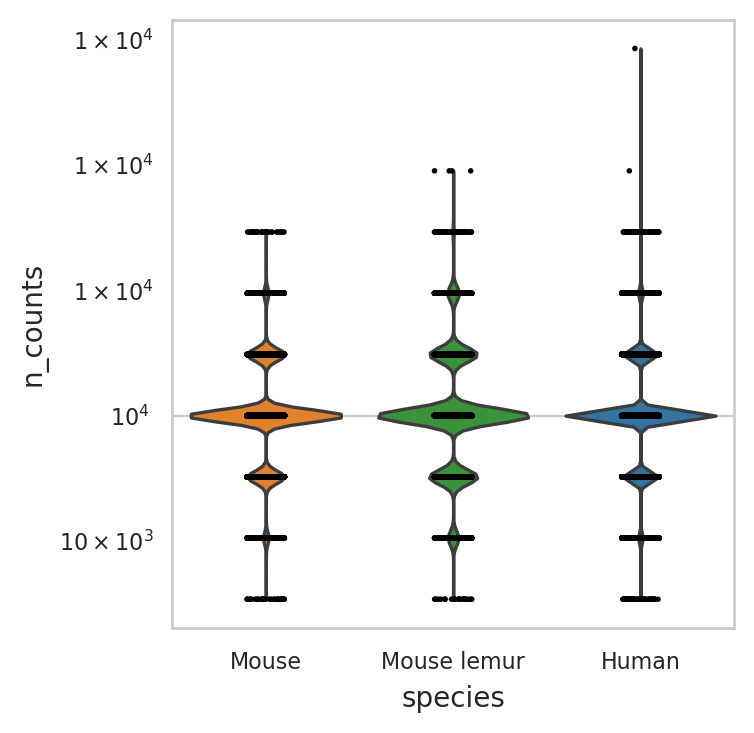

<Figure size 800x800 with 0 Axes>

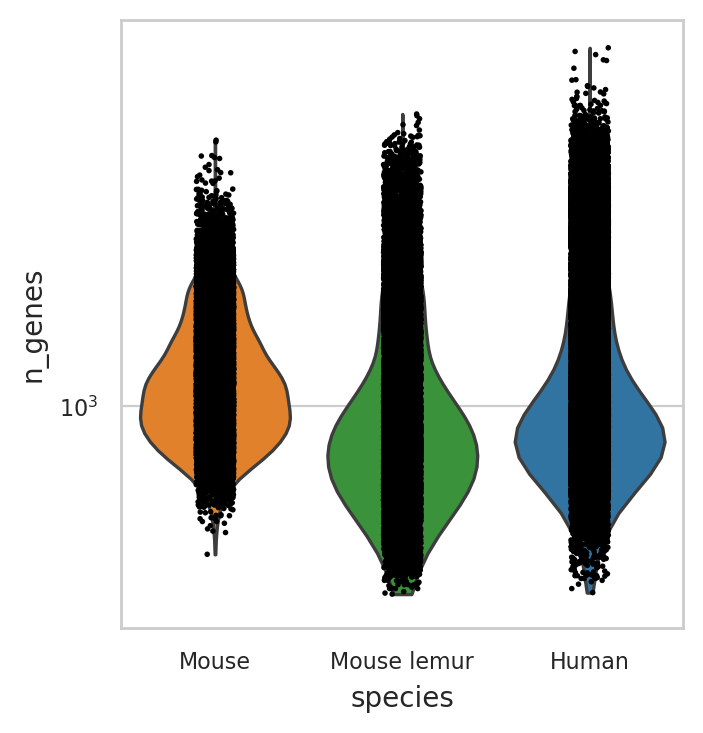

<Figure size 800x800 with 0 Axes>

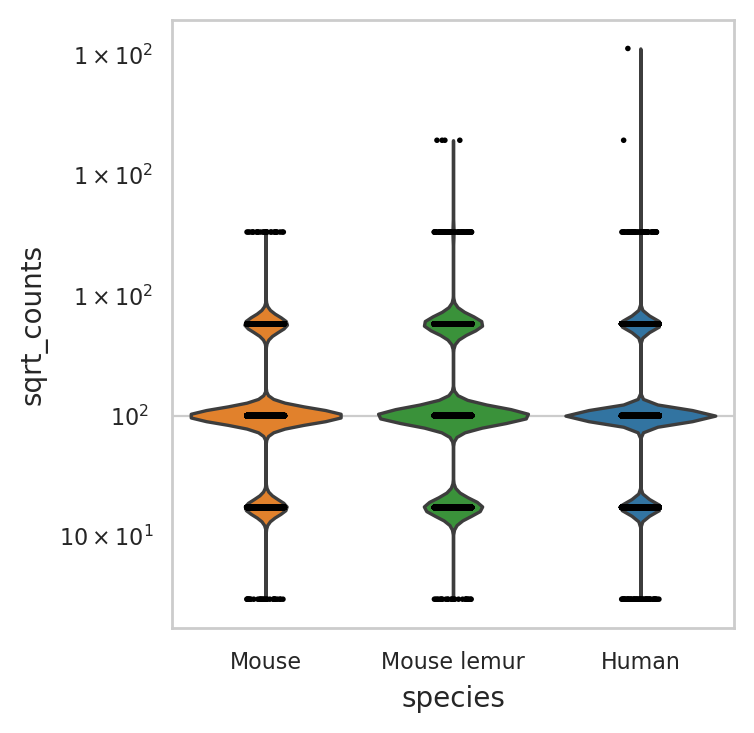

<Figure size 800x800 with 0 Axes>

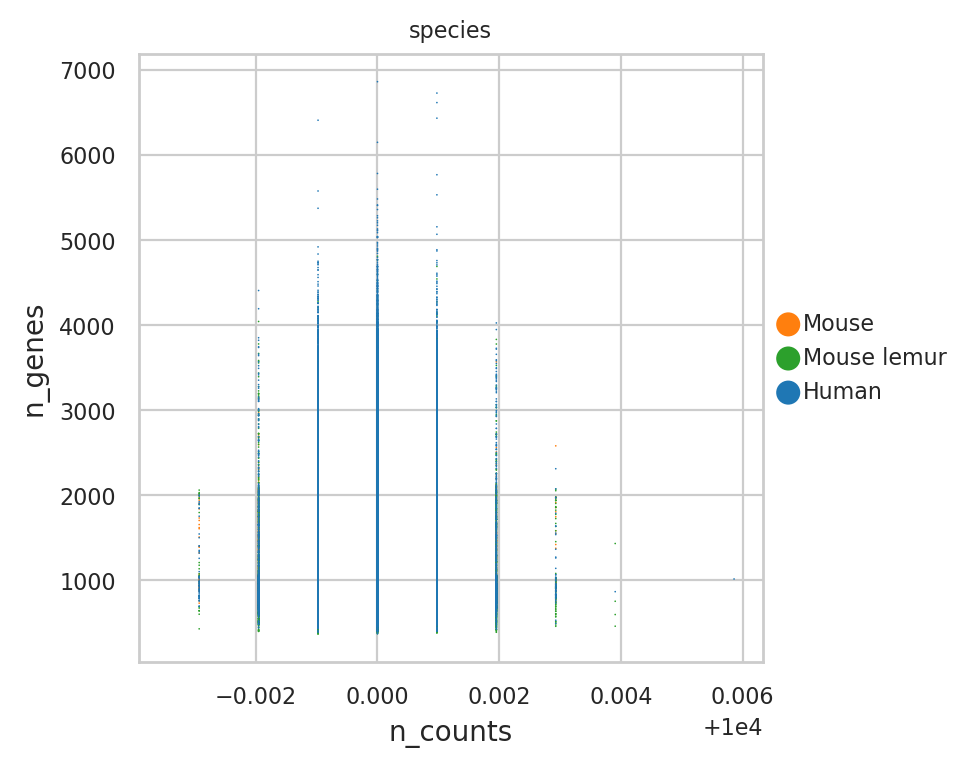

<Figure size 800x800 with 0 Axes>

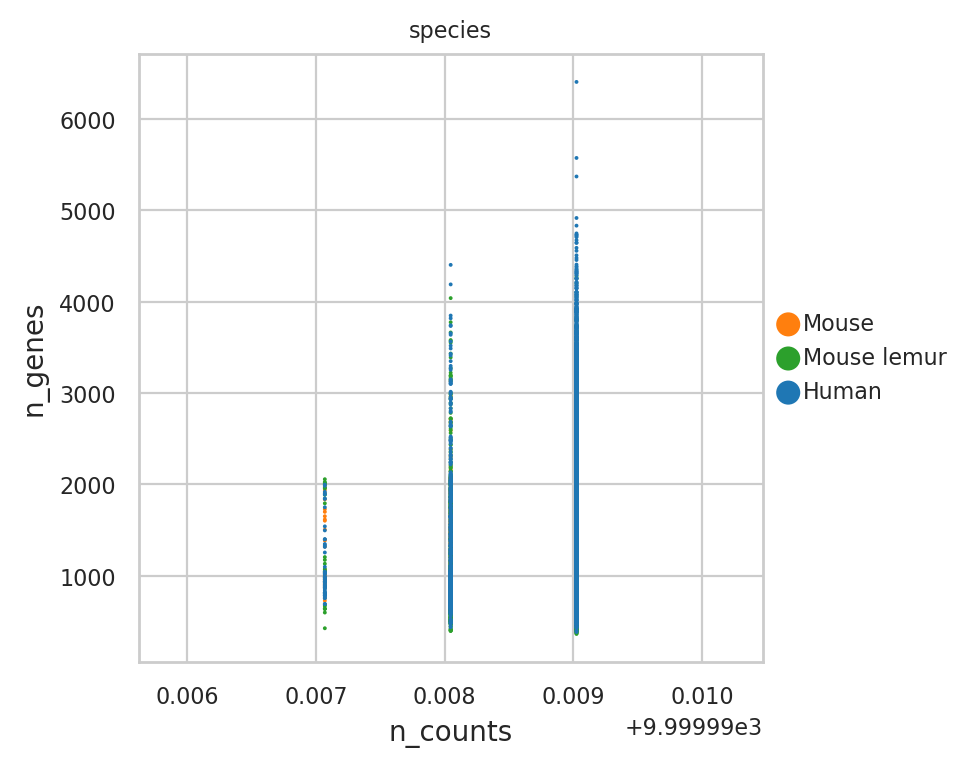

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 800x800 with 0 Axes>

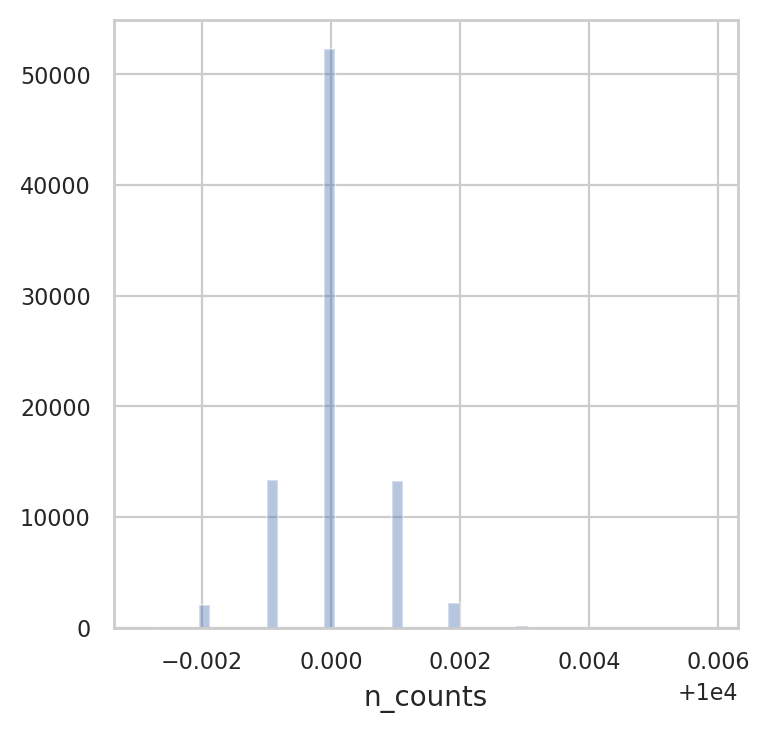

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2595: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


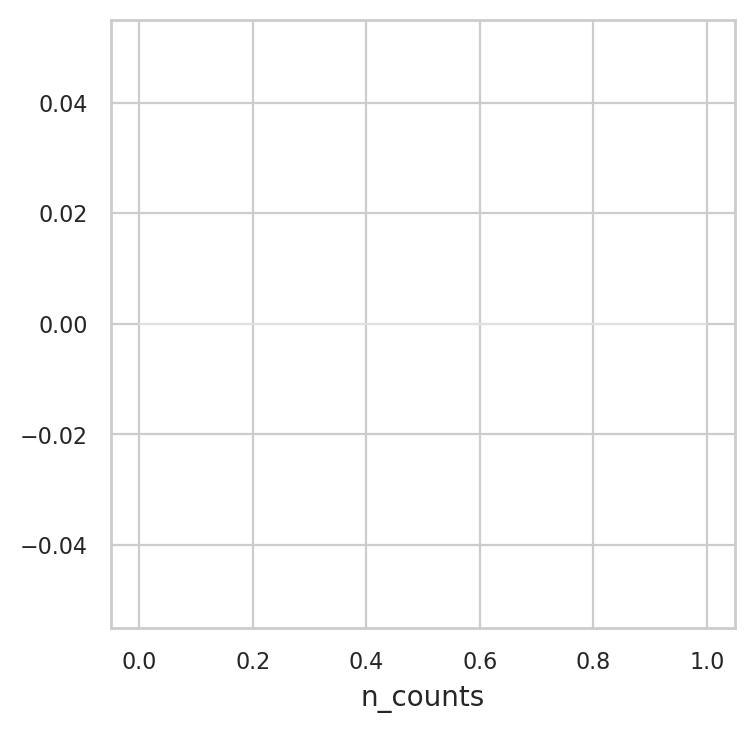

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


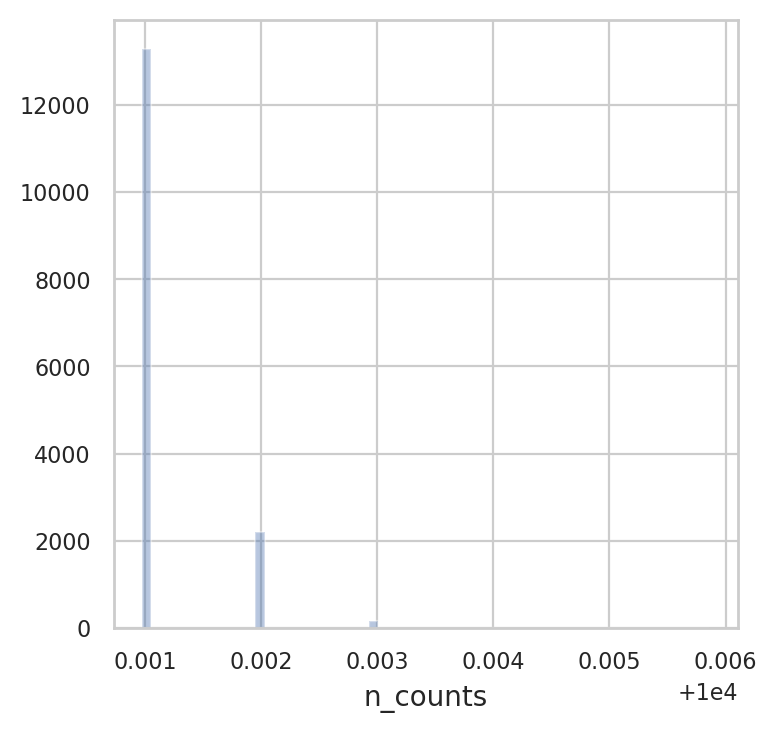

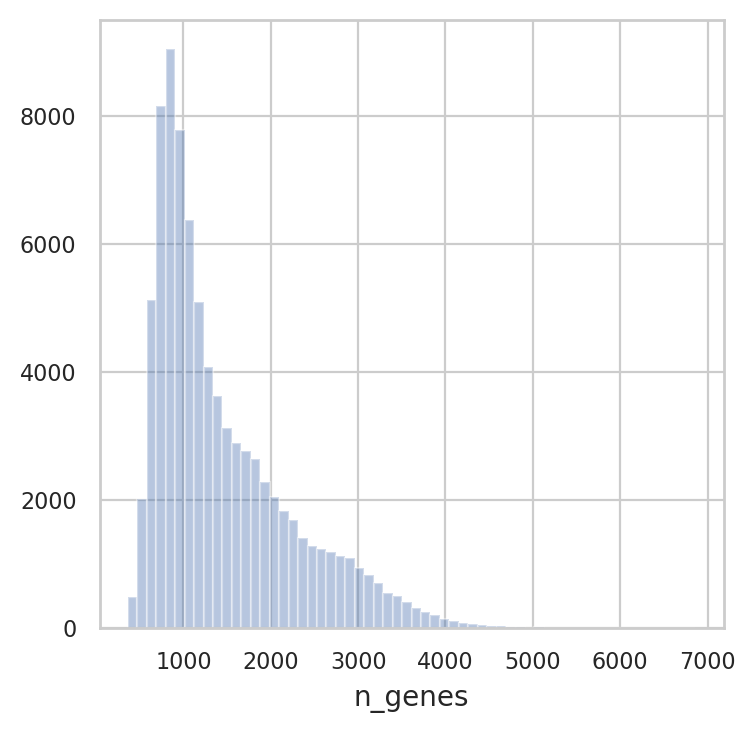

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


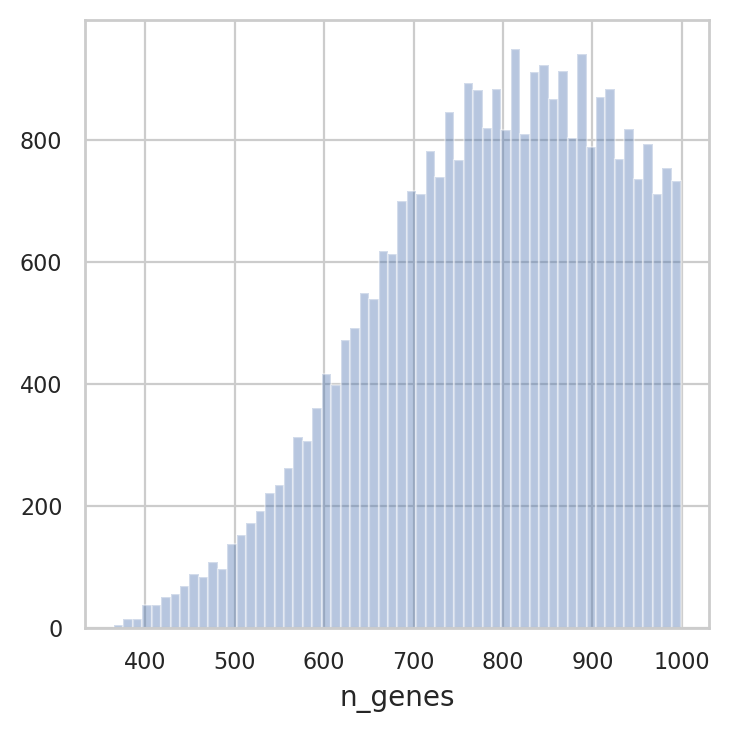

Total number of cells: 83526
Number of cells after min count filter: 83526
Number of cells after gene filter: 83526
Total number of genes: 12972


normalizing counts per cell


Number of genes after cell filter: 12972


    finished (0:00:00)


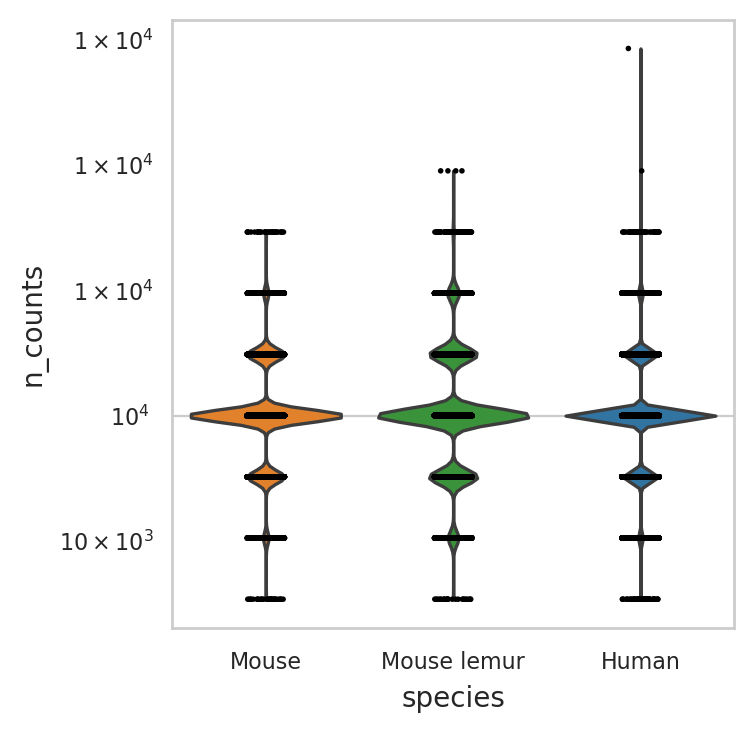

<Figure size 800x800 with 0 Axes>

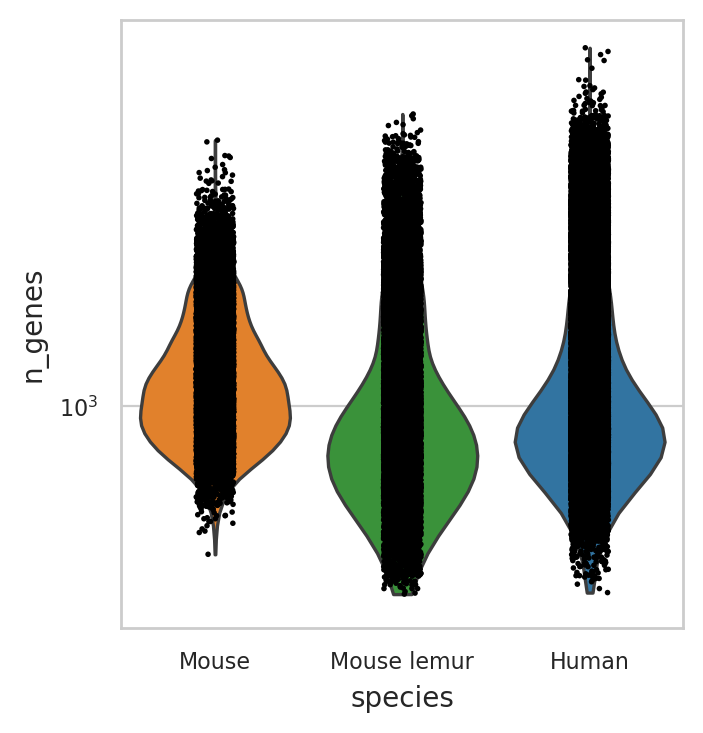

<Figure size 800x800 with 0 Axes>

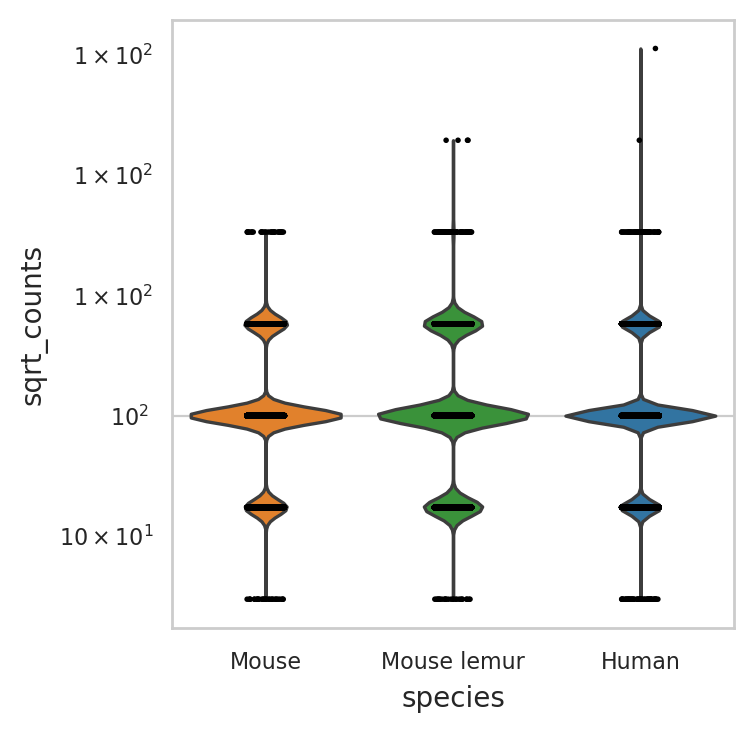

<Figure size 800x800 with 0 Axes>

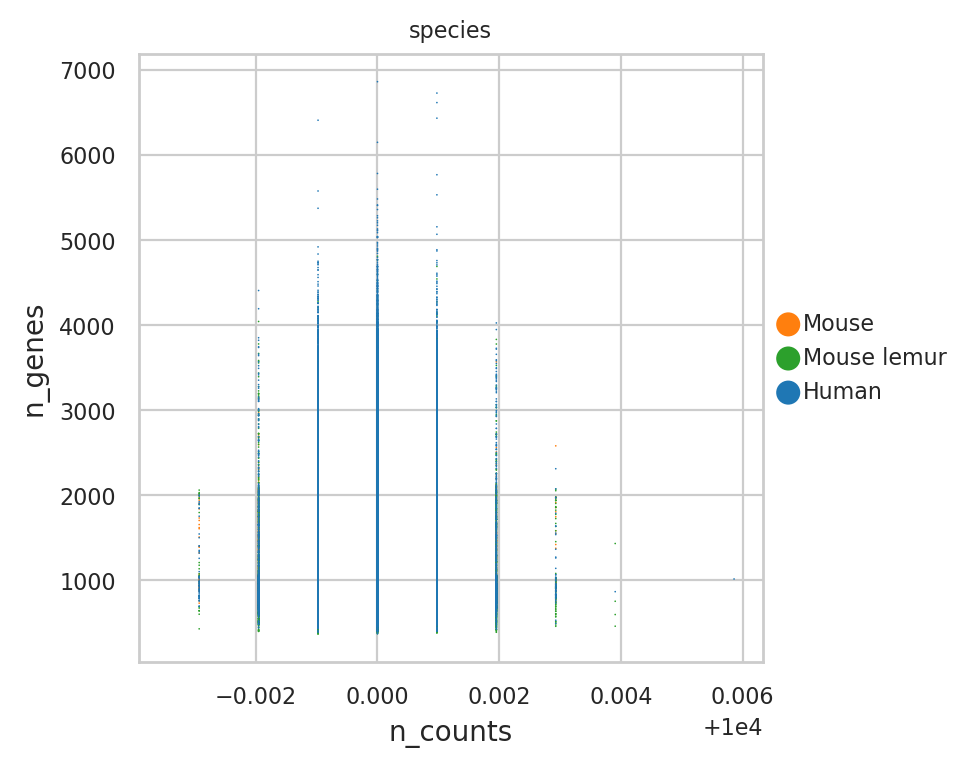

<Figure size 800x800 with 0 Axes>

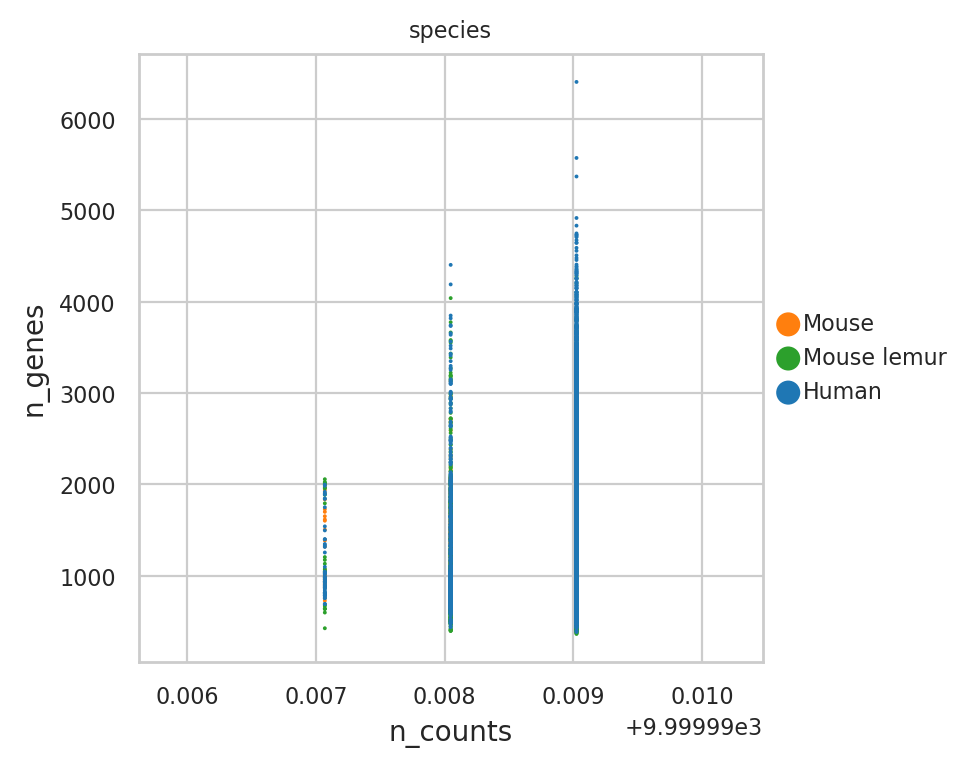

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 800x800 with 0 Axes>

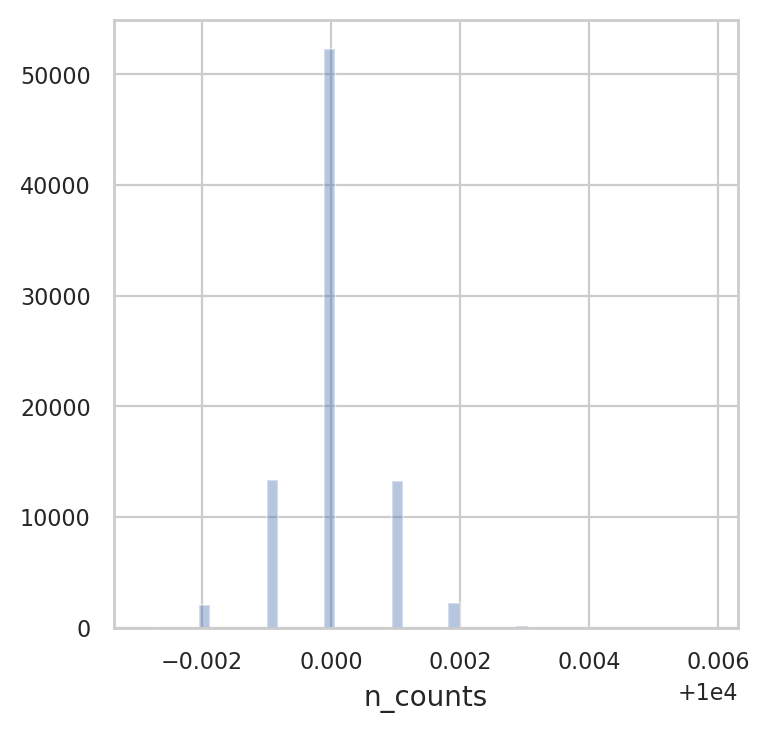

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2595: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


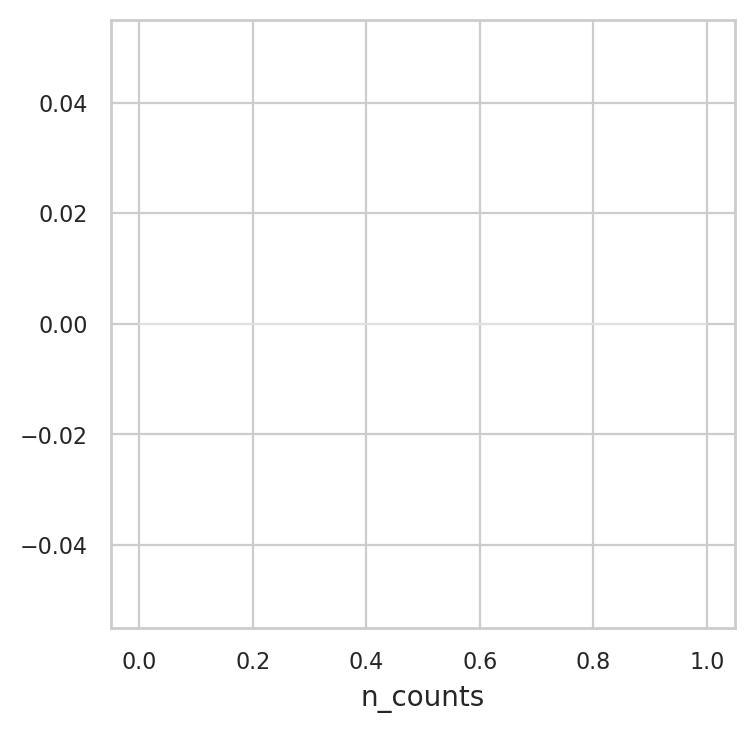

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


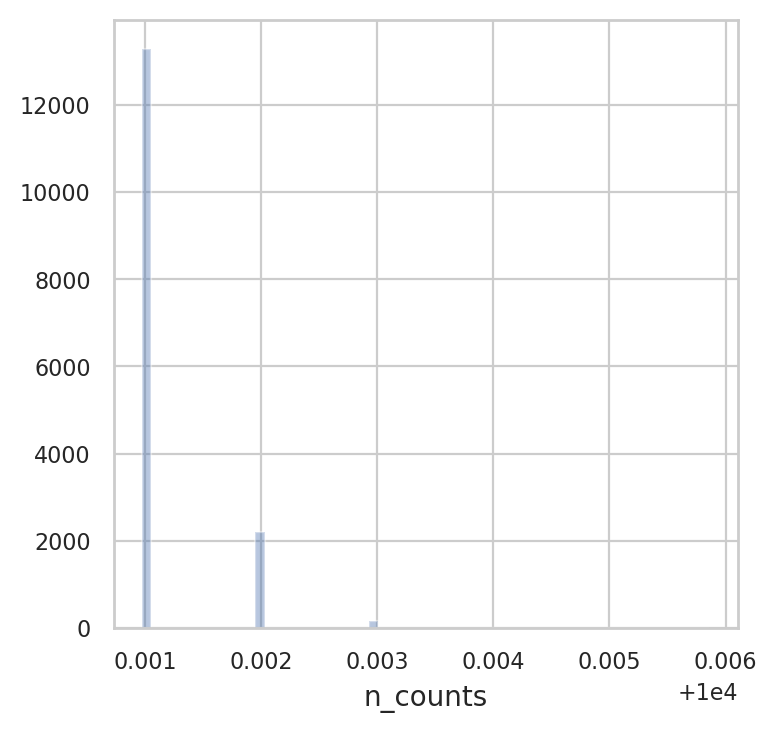

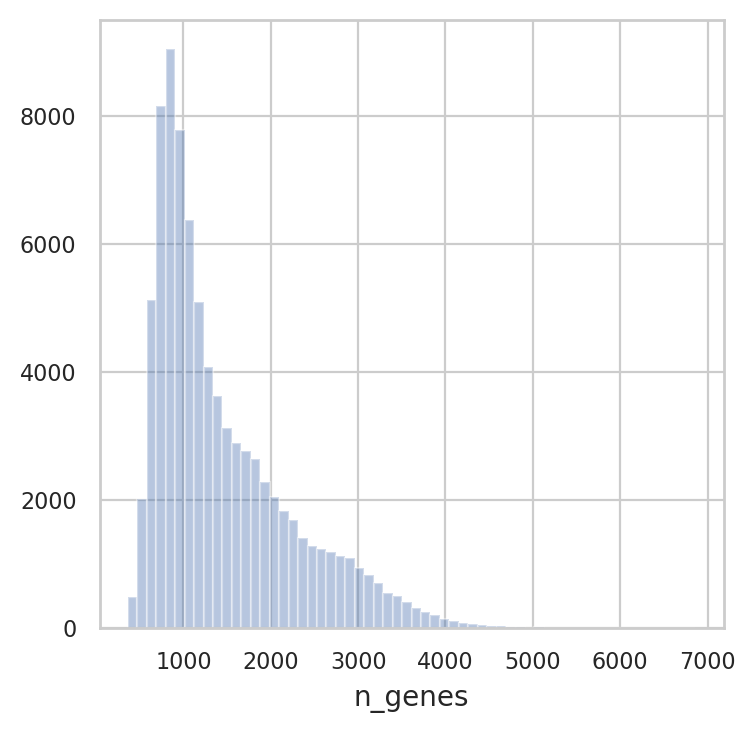

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


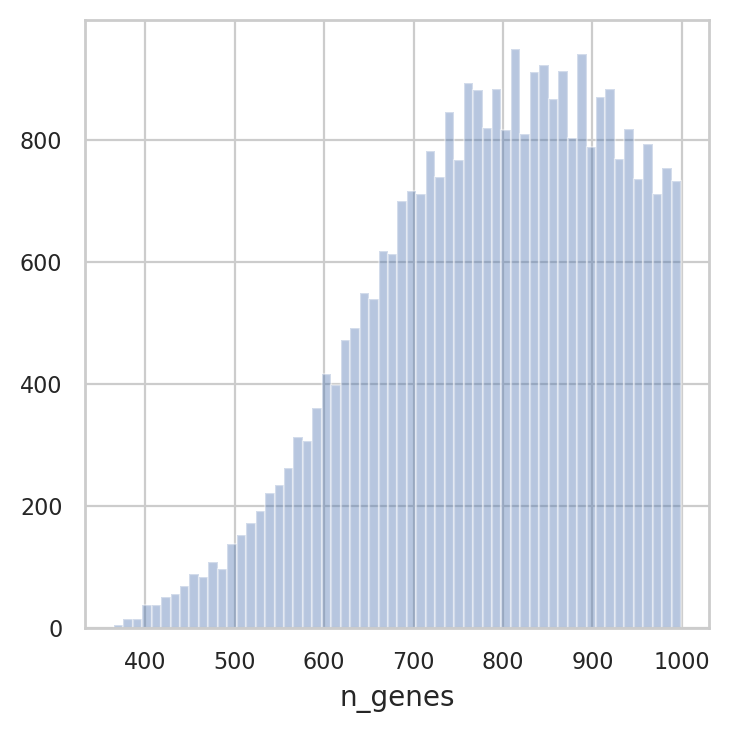

In [197]:
adata = preprocess.add_compartment_combined_cols(adata)
adata = preprocess.filter_genes_cells(adata)

## Do PCA + k-nearest neighbors pre-subsetting to only shared celltypes

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50



 Number of highly variable genes: 3270


    finished (0:00:12)


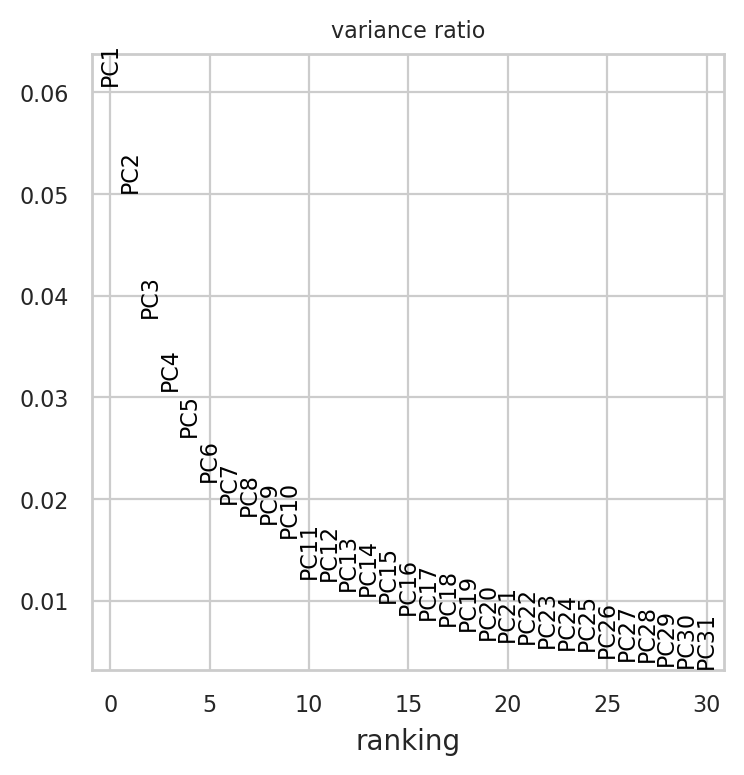

<Figure size 800x800 with 0 Axes>

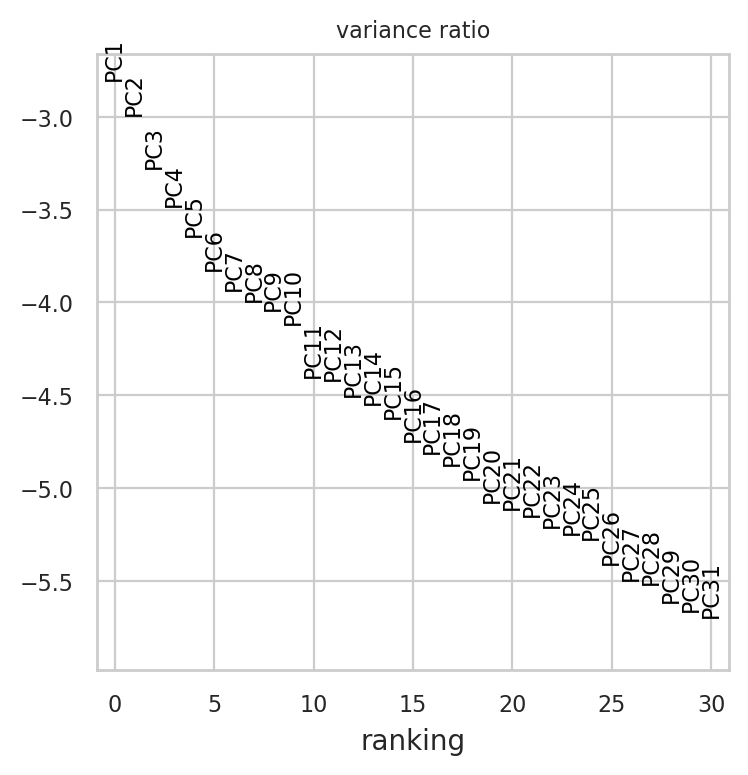

computing PCA
    on highly variable genes
    with n_comps=40
    finished (0:00:10)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:18)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:14)


<Figure size 800x800 with 0 Axes>

In [198]:
adata = preprocess.dimensionality_reduction(adata)
# Pre-BBKNN UMAPs

In [199]:
preprocess.remove_color_palettes(adata)

removing 'species_colors'


### Plot sftpc


# Plot shared cell types

In [200]:
min_cells_per_celltype

20

In [201]:


adata = preprocess.filter_min_cells_per_group(
    adata,
    celltype_col=celltype_col,
    species_col=species_col,
    min_cells_per_celltype=min_cells_per_celltype,
)


Filtering for celltype column narrow_group with at least 20 cells per species
--- Before filtering ---
-- Number of cell types: 22 --
narrow_group                              species    
B cell                                    Mouse           1457
                                          Mouse lemur      238
                                          Human            230
CD4+ T cell                               Mouse            534
                                          Mouse lemur     1258
                                          Human           2297
CD8+ T cell                               Mouse            854
                                          Mouse lemur      388
                                          Human           1942
adventitial fibroblast                    Mouse            517
                                          Mouse lemur      317
                                          Human            527
alveolar epithelial cell type 2           Mouse         

## Plot shared cell types

In [202]:
from plot_utils import save_figures

(66, 4)
--- compartment: endothelial ---


/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:64: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout(*args, **kwargs)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:49: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(**kwargs)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:64: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout(*args, **kwargs)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:49: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  a

--- compartment: epithelial ---
--- compartment: lymphoid ---


/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:64: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout(*args, **kwargs)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:49: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(**kwargs)


--- compartment: myeloid ---


/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:64: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout(*args, **kwargs)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:49: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(**kwargs)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:64: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout(*args, **kwargs)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/axisgrid.py:49: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  a

--- compartment: stromal ---


Saving figures: 100%|██████████| 5/5 [00:25<00:00,  5.07s/it]


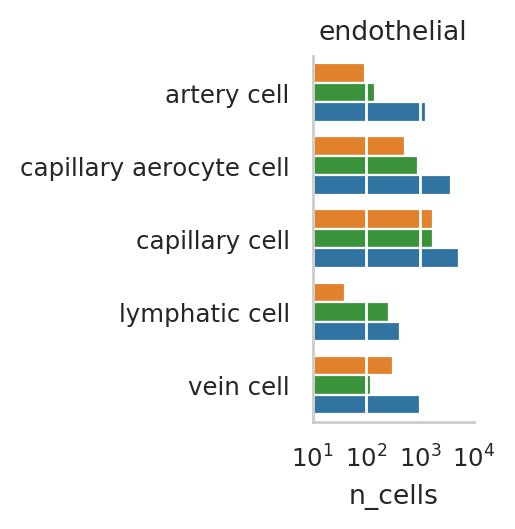

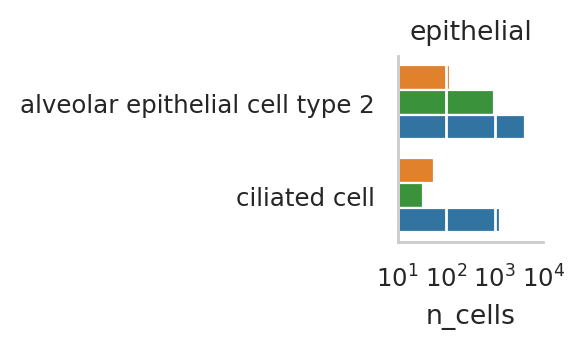

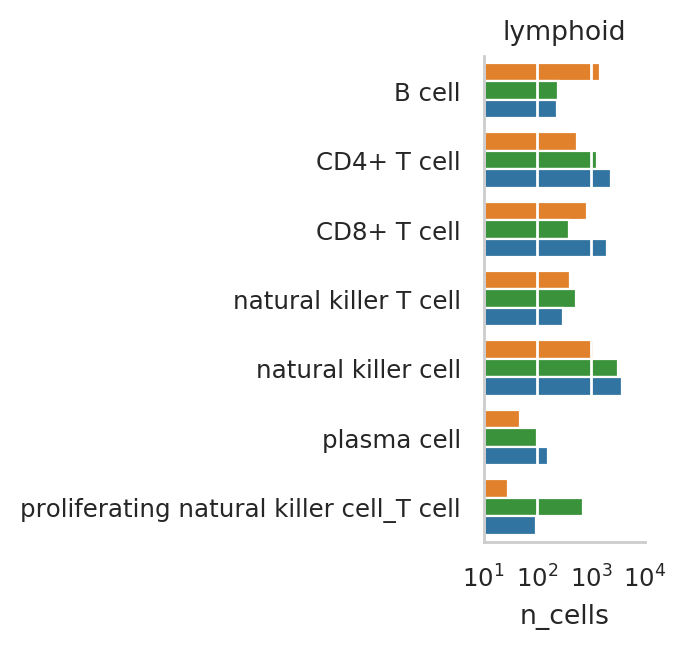

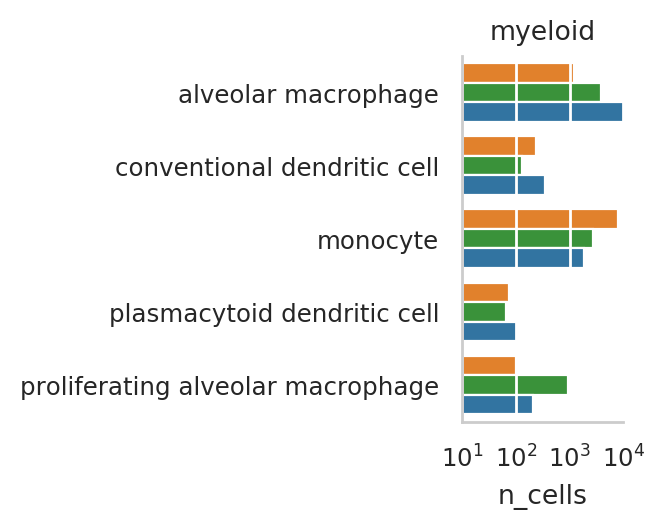

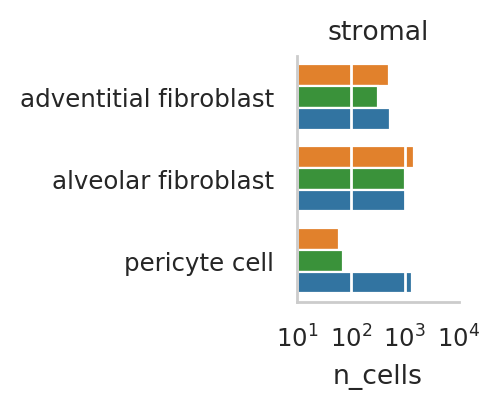

In [203]:
preprocess.plot_shared_cell_types(adata, celltype_col, compartment_col, species_col)
save_figures(os.path.join(figure_folder, 'shared_cell_types'))

# Dimensionality reduction

## Do PCA + k-nearest neighbors pre-batch correction with BBKNN

extracting highly variable genes
    finished (0:00:01)
Trying to set attribute `.uns` of view, copying.
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50



 Number of highly variable genes: 3270


    finished (0:00:11)


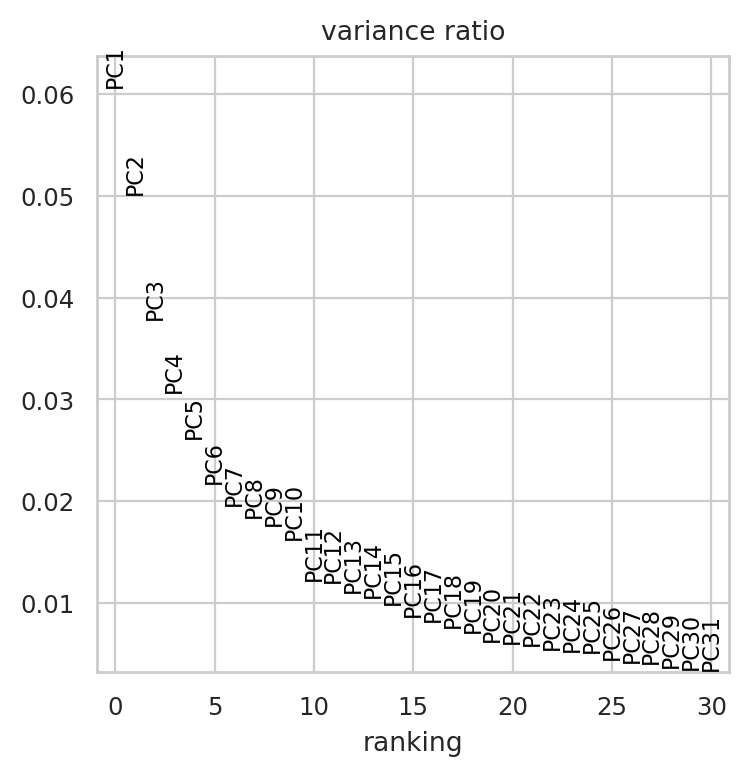

<Figure size 800x800 with 0 Axes>

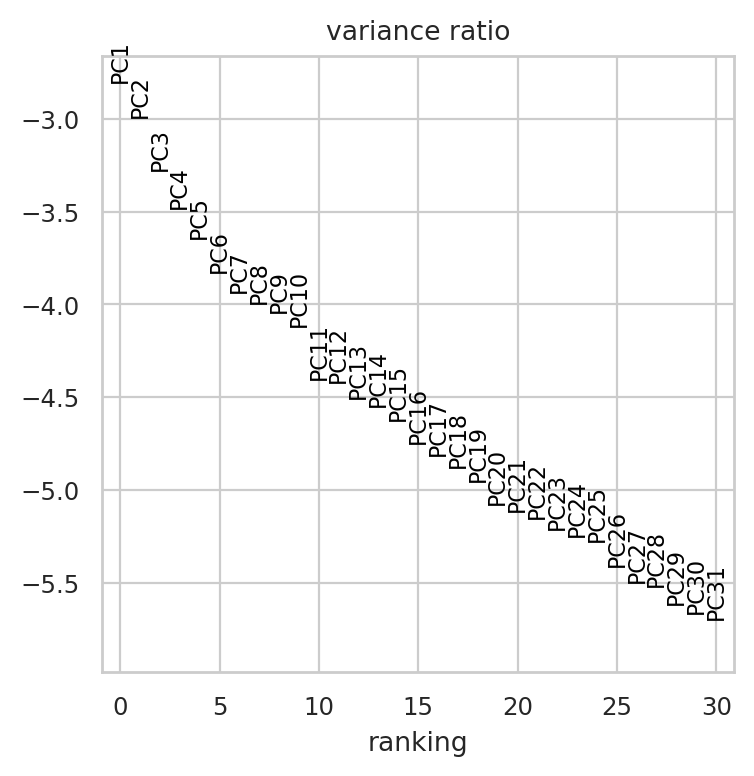

computing PCA
    on highly variable genes
    with n_comps=40
    finished (0:00:10)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:18)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:18)


<Figure size 800x800 with 0 Axes>

In [204]:
adata = preprocess.dimensionality_reduction(adata)
# Pre-BBKNN UMAPs

In [205]:
preprocess.remove_color_palettes(adata)

Error plotting with colors=['species', 'species_batch', 'age', 'individual'], skipping


<Figure size 3864x800 with 0 Axes>

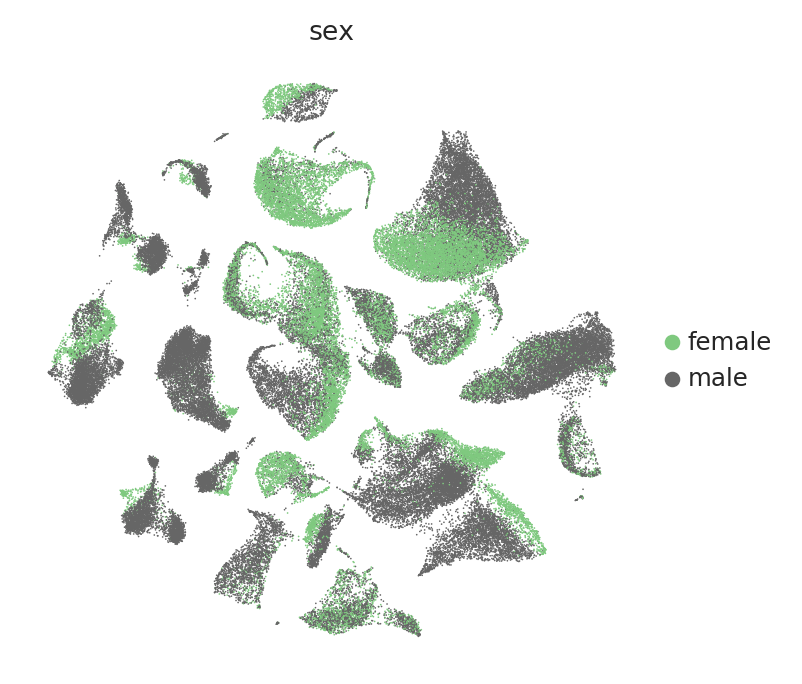

<Figure size 800x800 with 0 Axes>

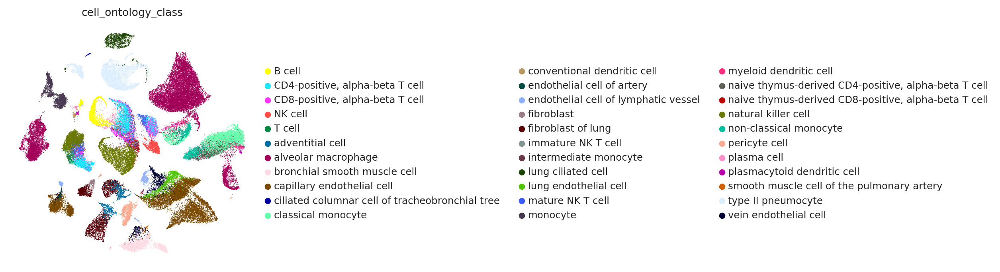

<Figure size 800x800 with 0 Axes>

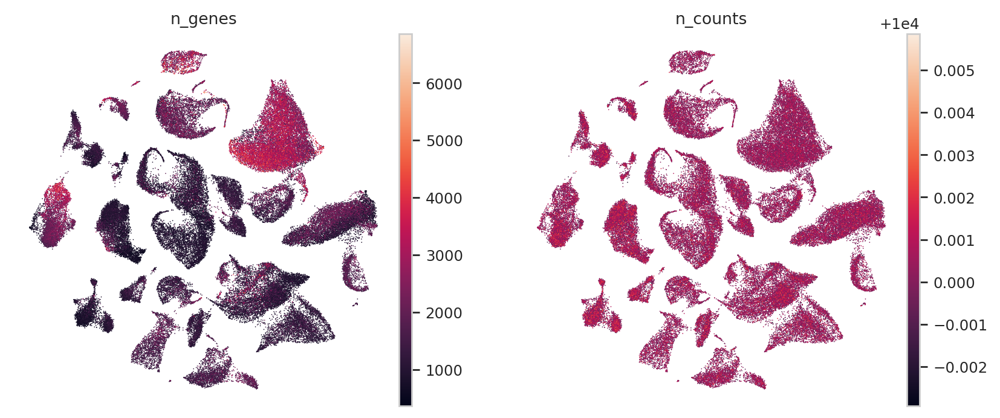

<Figure size 800x800 with 0 Axes>

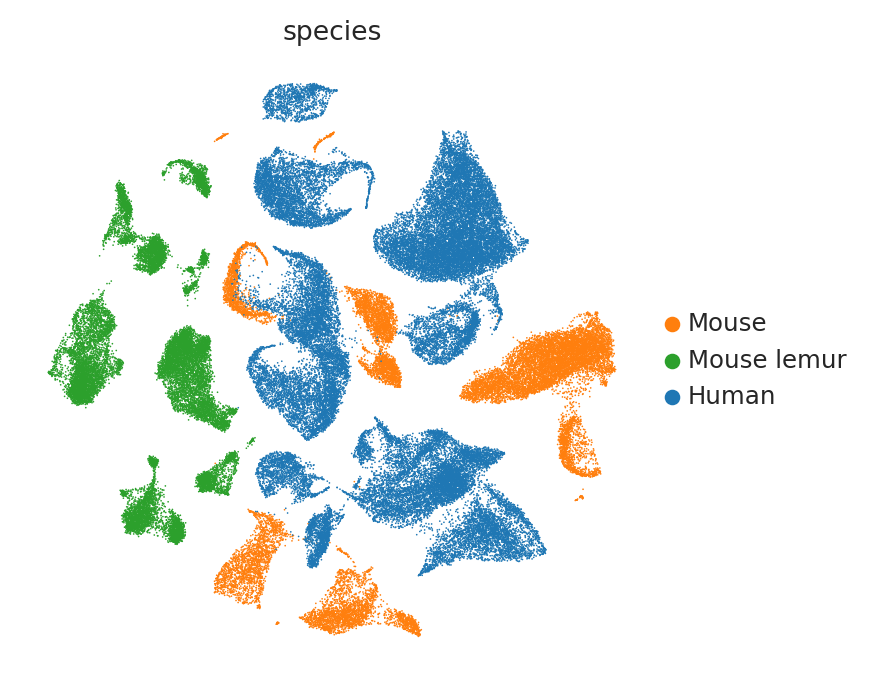

<Figure size 800x800 with 0 Axes>

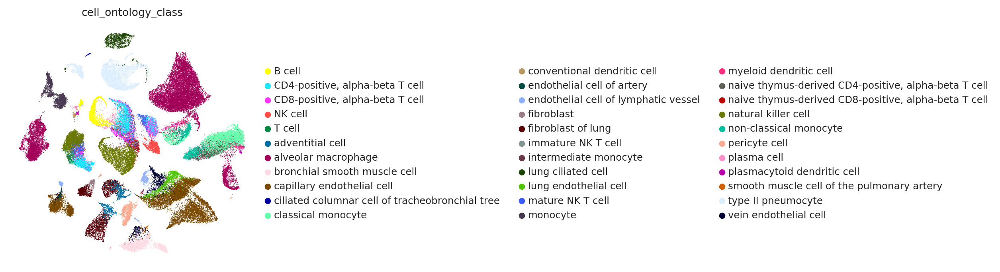

Error plotting with colors=['narrow_group', 'broad_group', 'compartment_group'], skipping


<Figure size 800x800 with 0 Axes>

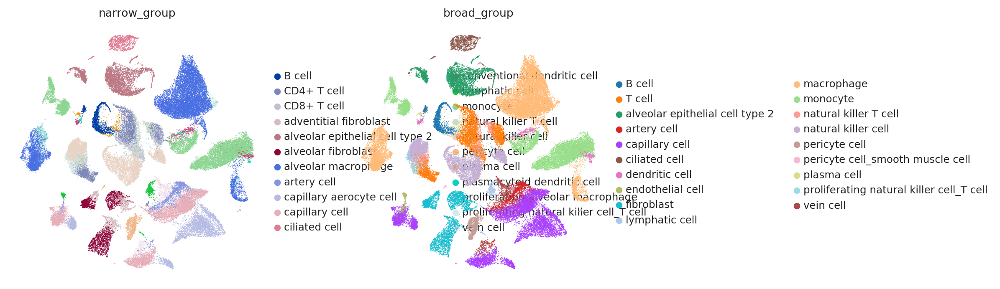

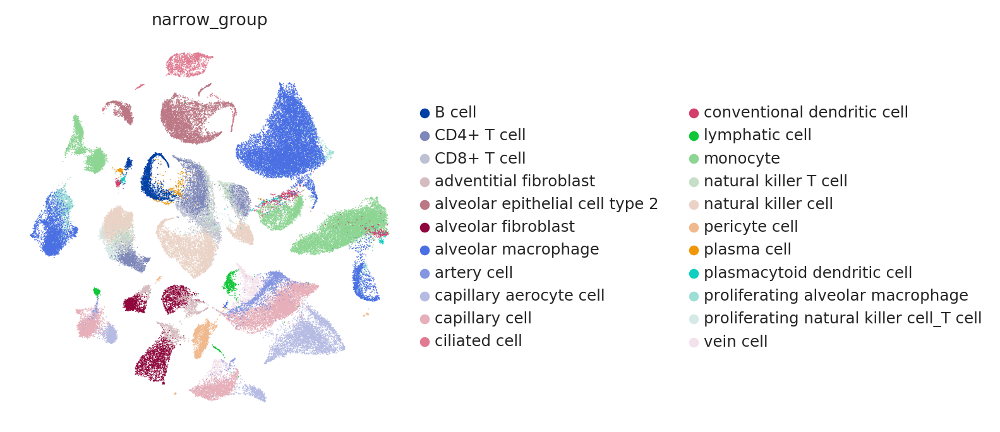

<Figure size 800x800 with 0 Axes>

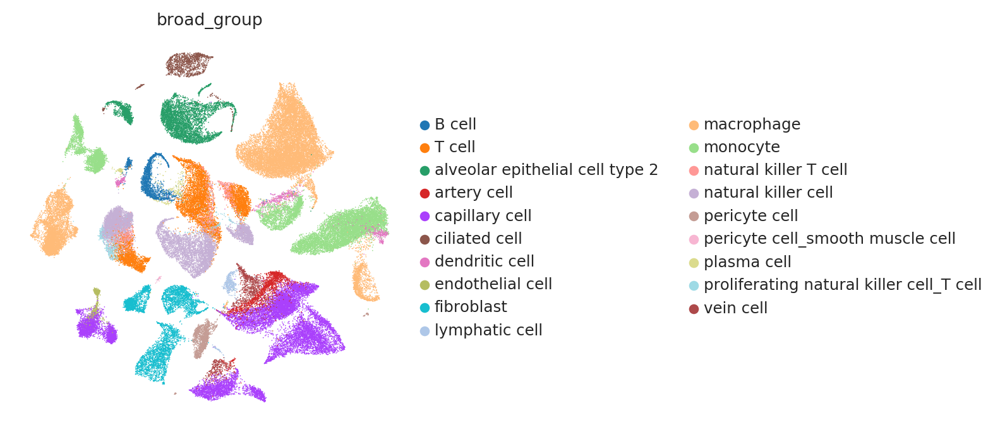

<Figure size 800x800 with 0 Axes>

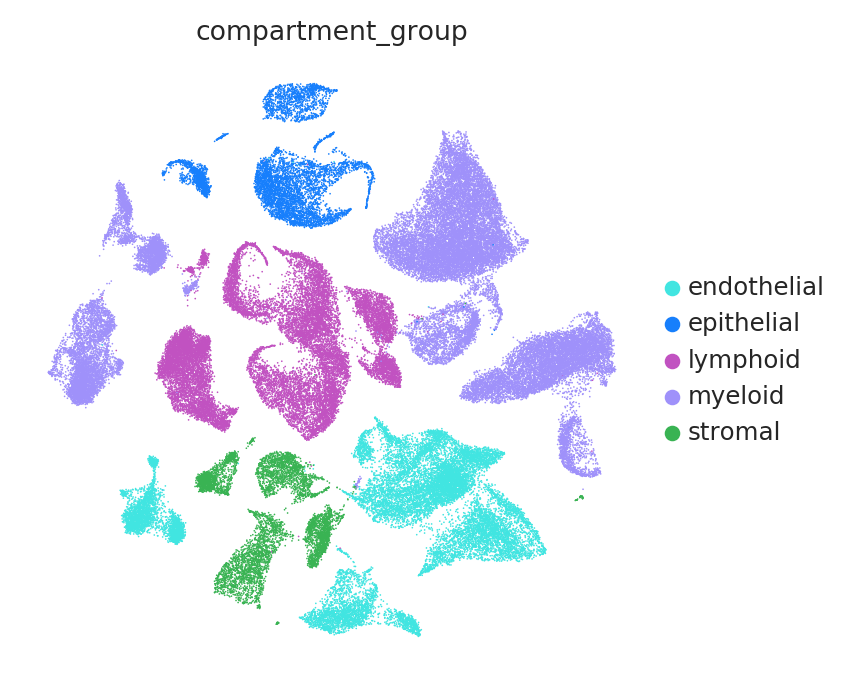

<Figure size 800x800 with 0 Axes>

In [206]:
preprocess.plot_umaps(adata)

## Do BBKNN, draw new umaps

In [207]:
preprocess.run_bbknn(adata)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:08)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:02)


In [208]:
# Post-BBKNN UMAPs
# preprocess.plot_umaps(adata)

In [209]:
preprocess.remove_color_palettes(adata)

removing 'species_colors'
removing 'sex_colors'
removing 'cell_ontology_class_colors'
removing 'narrow_group_colors'
removing 'broad_group_colors'
removing 'compartment_group_colors'


### Species

In [210]:
preprocess.remove_color_palettes(adata)

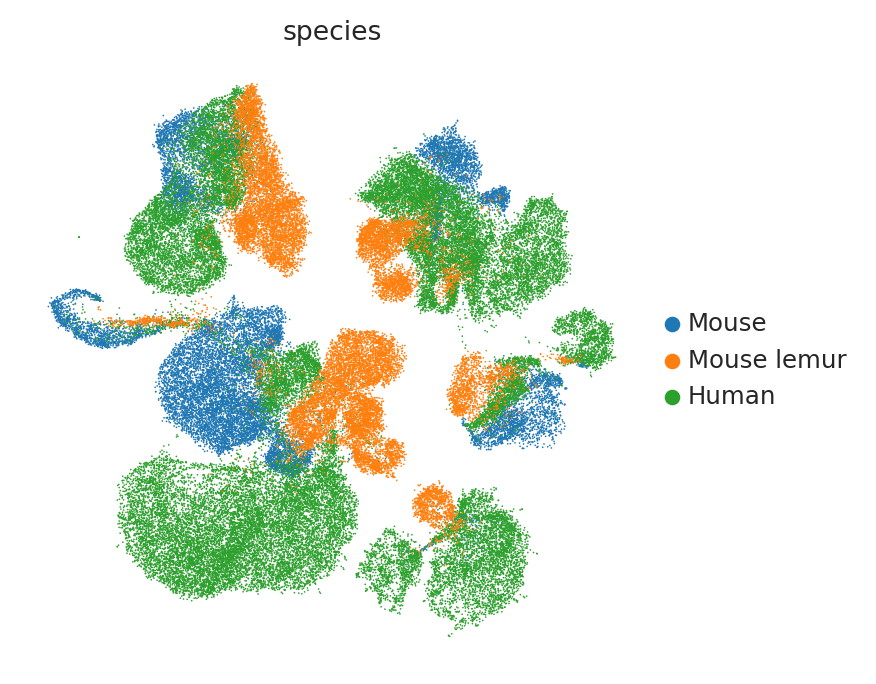

In [211]:
# there is some bug when the palette is pre-set
try:
    del adata.uns['species_colors']
except KeyError:
    pass

tab10 = sns.color_palette('tab10')

sc.pl.umap(adata, color='species', palette=tab10[:3], save='__species')

### Species batch

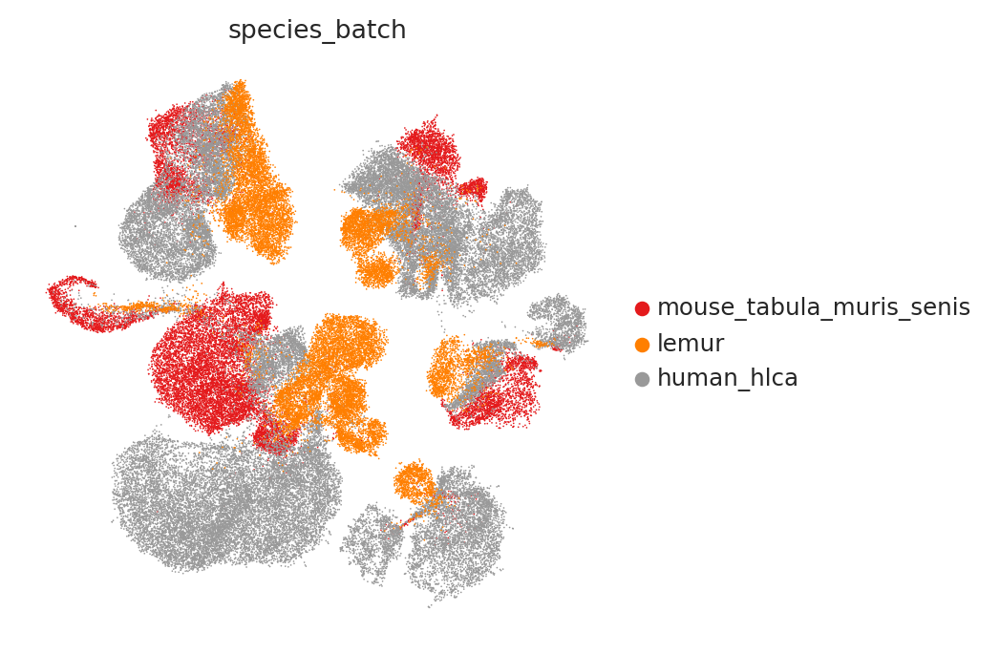

In [212]:
sc.pl.umap(adata, color='species_batch', palette='Set1', save='__species_batch')

### Narrow group

In [213]:
metadata = pd.read_csv(
    "/home/olga/googledrive/TabulaMicrocebus/data/h5ad-objs/ss2-10x-combined/LCA_SS2_10x_metadata_v1_wColor_wOrder.csv",
    index_col=0,
)
print(metadata.shape)
metadata.head()

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3051: DtypeWarning: Columns (8,12,34,35) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


(244081, 41)


,nCount_RNA,nFeature_RNA,cell_name,cell_barcode_10x,sequencing_run_10x,channel_10x,batch_SS2,possibly_contaminated_barcode_10x,method,individual,...,dendrogram_annotation_order,mix_hybrid,low_quality,asterix,dendrogram_subgroup_color_hex,dendrogram_subgroup_color_R,dendrogram_subgroup_color_G,dendrogram_subgroup_color_B,order__compartment_freeannotation_tissue,order__tissue_compartment_freeannotation
MAA001519_B108948_A10_S10,2467361,2526,MAA001519_B108948_A10_S10,NaN,NaN,NaN,0,NaN,smartseq2,Antoine,...,274.0,NaN,NaN,NaN,ffdcb8,255.0,220.0,184.0,767.0,767.0
MAA001519_B108948_A11_S11,2489227,2764,MAA001519_B108948_A11_S11,NaN,NaN,NaN,0,NaN,smartseq2,Antoine,...,274.0,NaN,NaN,NaN,ffdcb8,255.0,220.0,184.0,767.0,767.0
MAA001519_B108948_A12_S12,2267728,7156,MAA001519_B108948_A12_S12,NaN,NaN,NaN,0,NaN,smartseq2,Antoine,...,271.0,NaN,NaN,NaN,ffb870,255.0,184.0,112.0,764.0,764.0
MAA001519_B108948_A13_S13,1663223,3401,MAA001519_B108948_A13_S13,NaN,NaN,NaN,0,NaN,smartseq2,Antoine,...,274.0,NaN,NaN,NaN,ffdcb8,255.0,220.0,184.0,767.0,767.0
MAA001519_B108948_A14_S14,1410159,8500,MAA001519_B108948_A14_S14,NaN,NaN,NaN,0,NaN,smartseq2,Antoine,...,271.0,NaN,NaN,NaN,ffb870,255.0,184.0,112.0,764.0,764.0


In [214]:
metadata_colors = metadata[[x for x in metadata.columns if ('dendrogram' in x or 'color' in x) and ('name' in x or 'hex' in x)]]
hex_cols = [x for x in metadata_colors.columns if 'hex' in x]
metadata_colors[hex_cols] = '#' + metadata_colors[hex_cols]
metadata_colors.head()

/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/pandas/core/frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


,dendrogram_group_name,dendrogram_group_color_name,dendrogram_group_color_hex,dendrogram_subgroup_name,dendrogram_subgroup_color_hex
MAA001519_B108948_A10_S10,germ,orange,#ff8911,spermatid,#ffdcb8
MAA001519_B108948_A11_S11,germ,orange,#ff8911,spermatid,#ffdcb8
MAA001519_B108948_A12_S12,germ,orange,#ff8911,spermatocyte,#ffb870
MAA001519_B108948_A13_S13,germ,orange,#ff8911,spermatid,#ffdcb8
MAA001519_B108948_A14_S14,germ,orange,#ff8911,spermatocyte,#ffb870


In [215]:
adata.obs.head()

,age,cell_id,cell_ontology_class,cell_ontology_id,free_annotation,n_genes,sex,subtissue,tissue,species,...,asdf,asdf_colors,dendrogram_group,dendrogram_group_name,dendrogram_group_color_name,dendrogram_group_color_hex,dendrogram_subgroup_name,dendrogram_subgroup_color_hex,dendrogram_group_name_colors,dendrogram_subgroup_name_colors
AAACGGGTCGCCCTTA-1-11-0-0-mouse_tabula_muris_senis,18m,MACA_18m_F_LUNG_50_AAACGGGTCGCCCTTA,B cell,NA,B,1393,female,nan,Lung,Mouse,...,B cell,#c152c1,B cell,immune,magenta,#c152c1,B cell,#c152c1,#c152c1,#c152c1
AAAGATGAGCAGACTG-1-11-0-0-mouse_tabula_muris_senis,18m,MACA_18m_F_LUNG_50_AAAGATGAGCAGACTG,non-classical monocyte,NA,Nonclassical Monocyte,1016,female,nan,Lung,Mouse,...,monocyte,#d9d3fd,monocyte,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd,#9f91fa,#d9d3fd
AAAGATGAGCCGTCGT-1-11-0-0-mouse_tabula_muris_senis,18m,MACA_18m_F_LUNG_50_AAAGATGAGCCGTCGT,NK cell,NA,Natural Killer,1108,female,nan,Lung,Mouse,...,natural killer cell,#da97da,natural killer cell,immune,magenta,#c152c1,NK_T cell,#da97da,#c152c1,#da97da
AAAGCAACATGGTAGG-1-11-0-0-mouse_tabula_muris_senis,18m,MACA_18m_F_LUNG_50_AAAGCAACATGGTAGG,alveolar macrophage,NA,Alveolar Macrophage,2596,female,nan,Lung,Mouse,...,alveolar macrophage,#d9d3fd,alveolar macrophage,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd,#9f91fa,#d9d3fd
AAAGCAAGTCTAGTGT-1-11-0-0-mouse_tabula_muris_senis,18m,MACA_18m_F_LUNG_50_AAAGCAAGTCTAGTGT,B cell,NA,B,876,female,nan,Lung,Mouse,...,B cell,#c152c1,B cell,immune,magenta,#c152c1,B cell,#c152c1,#c152c1,#c152c1


In [216]:
lemur_obs = adata.obs.query('species == "Mouse lemur"')
lemur_obs.head()

,age,cell_id,cell_ontology_class,cell_ontology_id,free_annotation,n_genes,sex,subtissue,tissue,species,...,asdf,asdf_colors,dendrogram_group,dendrogram_group_name,dendrogram_group_color_name,dendrogram_group_color_hex,dendrogram_subgroup_name,dendrogram_subgroup_color_hex,dendrogram_group_name_colors,dendrogram_subgroup_name_colors
Martine_Lung_10X_AAACCTGAGAGAGCTC-lemur,12y,nan,monocyte,nan,monocyte,1343,female,nan,Lung,Mouse lemur,...,monocyte,#d9d3fd,monocyte,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd,#9f91fa,#d9d3fd
Martine_Lung_10X_AAACCTGCACCAGATT-lemur,12y,nan,capillary endothelial cell,nan,capillary cell (FABP4- RBP7-),1309,female,nan,Lung,Mouse lemur,...,capillary cell,#b3f5f3,capillary cell,endothelial,cyan,#41e5e1,capillary,#b3f5f3,#41e5e1,#b3f5f3
Martine_Lung_10X_AAACCTGCAGCCAGAA-lemur,12y,nan,alveolar macrophage,nan,alveolar macrophage,2345,female,nan,Lung,Mouse lemur,...,alveolar macrophage,#d9d3fd,alveolar macrophage,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd,#9f91fa,#d9d3fd
Martine_Lung_10X_AAACCTGCAGTATGCT-lemur,12y,nan,monocyte,nan,monocyte,1305,female,nan,Lung,Mouse lemur,...,monocyte,#d9d3fd,monocyte,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd,#9f91fa,#d9d3fd
Martine_Lung_10X_AAACCTGGTGCTAGCC-lemur,12y,nan,alveolar macrophage,nan,alveolar macrophage (PF),3568,female,nan,Lung,Mouse lemur,...,proliferating alveolar macrophage,#d9d3fd,proliferating alveolar macrophage,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd,#9f91fa,#d9d3fd


In [221]:
overlapping_columns = metadata_colors.columns.intersection(lemur_obs.columns)

# Add contingency plan in case the cells below were run already
if len(overlapping_columns) == 0:
    lemur_obs_colors = lemur_obs.merge(metadata_colors, left_on='cell_id_v2', right_index=True)
else:
    lemur_obs_colors = lemur_obs
lemur_obs_colors.head()

,age,cell_id,cell_ontology_class,cell_ontology_id,free_annotation,n_genes,sex,subtissue,tissue,species,...,asdf,asdf_colors,dendrogram_group,dendrogram_group_name,dendrogram_group_color_name,dendrogram_group_color_hex,dendrogram_subgroup_name,dendrogram_subgroup_color_hex,dendrogram_group_name_colors,dendrogram_subgroup_name_colors
Martine_Lung_10X_AAACCTGAGAGAGCTC-lemur,12y,nan,monocyte,nan,monocyte,1343,female,nan,Lung,Mouse lemur,...,monocyte,#d9d3fd,monocyte,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd,#9f91fa,#d9d3fd
Martine_Lung_10X_AAACCTGCACCAGATT-lemur,12y,nan,capillary endothelial cell,nan,capillary cell (FABP4- RBP7-),1309,female,nan,Lung,Mouse lemur,...,capillary cell,#b3f5f3,capillary cell,endothelial,cyan,#41e5e1,capillary,#b3f5f3,#41e5e1,#b3f5f3
Martine_Lung_10X_AAACCTGCAGCCAGAA-lemur,12y,nan,alveolar macrophage,nan,alveolar macrophage,2345,female,nan,Lung,Mouse lemur,...,alveolar macrophage,#d9d3fd,alveolar macrophage,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd,#9f91fa,#d9d3fd
Martine_Lung_10X_AAACCTGCAGTATGCT-lemur,12y,nan,monocyte,nan,monocyte,1305,female,nan,Lung,Mouse lemur,...,monocyte,#d9d3fd,monocyte,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd,#9f91fa,#d9d3fd
Martine_Lung_10X_AAACCTGGTGCTAGCC-lemur,12y,nan,alveolar macrophage,nan,alveolar macrophage (PF),3568,female,nan,Lung,Mouse lemur,...,proliferating alveolar macrophage,#d9d3fd,proliferating alveolar macrophage,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd,#9f91fa,#d9d3fd


In [222]:
narrow_group_to_dendrogram_info = (
    lemur_obs_colors[["narrow_group"] + metadata_colors.columns.tolist()].set_index(
        "narrow_group"
    )
)

# Get rid of duplicate narrow group
narrow_group_to_dendrogram_info = narrow_group_to_dendrogram_info.loc[
    ~narrow_group_to_dendrogram_info.index.duplicated()
]
print(narrow_group_to_dendrogram_info.shape)
narrow_group_to_dendrogram_info.head()

(22, 5)


,dendrogram_group_name,dendrogram_group_color_name,dendrogram_group_color_hex,dendrogram_subgroup_name,dendrogram_subgroup_color_hex
narrow_group,,,,,
monocyte,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd
capillary cell,endothelial,cyan,#41e5e1,capillary,#b3f5f3
alveolar macrophage,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd
proliferating alveolar macrophage,immune,light purple,#9f91fa,monocyte_macrophage,#d9d3fd
CD4+ T cell,immune,magenta,#c152c1,NK_T cell,#da97da


In [223]:
narrow_group_to_dendrogram_info.columns.intersection(adata.obs.columns)

Index(['dendrogram_group_name', 'dendrogram_group_color_name',
       'dendrogram_group_color_hex', 'dendrogram_subgroup_name',
       'dendrogram_subgroup_color_hex'],
      dtype='object')

In [224]:
key_color_cols = {
    "dendrogram_group_name": "dendrogram_group_color_hex",
    "dendrogram_subgroup_name": "dendrogram_subgroup_color_hex",
}

In [225]:
overlapping_columns = narrow_group_to_dendrogram_info.columns.intersection(adata.obs.columns)
if len(overlapping_columns) == 0:
    adata.obs = adata.obs.join(narrow_group_to_dendrogram_info, on='narrow_group')
    
for key, color_col in key_color_cols.items():
    sorted_colors = pd.Series(
        adata.obs[[key, color_col]]
        .set_index(key)[color_col]
        .to_dict()
    ).sort_values()
    adata.uns[f'{key}_colors'] = sorted_colors.values.tolist()
#         adata.uns['dendrogram_group_name_colors'] = adata.obs['dendrogram_group_color_hex']
#         adata.uns['dendrogram_subgroup_name_colors'] = adata.obs['dendrogram_subgroup_color_hex']

In [226]:
sorted_colors

artery                 #34b7b4
vein                   #41e5e1
respiratory            #4599fd
fibroblast             #61c275
capillary              #b3f5f3
B cell                 #c152c1
monocyte_macrophage    #d9d3fd
lymphatic              #d9faf9
NK_T cell              #da97da
dendritic              #ece9fe
dtype: object

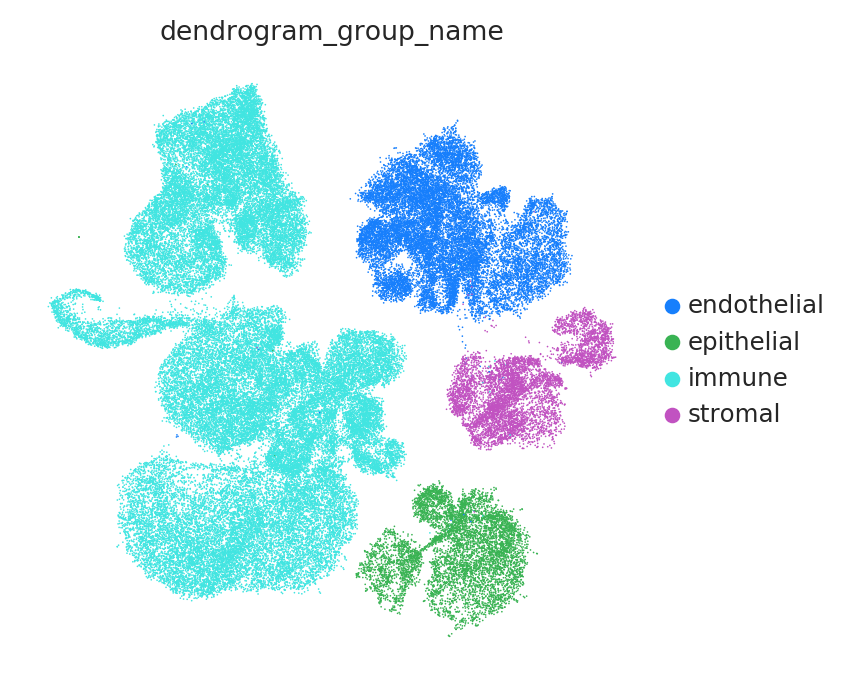

In [227]:
sc.pl.umap(adata, color='dendrogram_group_name', save='__dendrogram_group',)

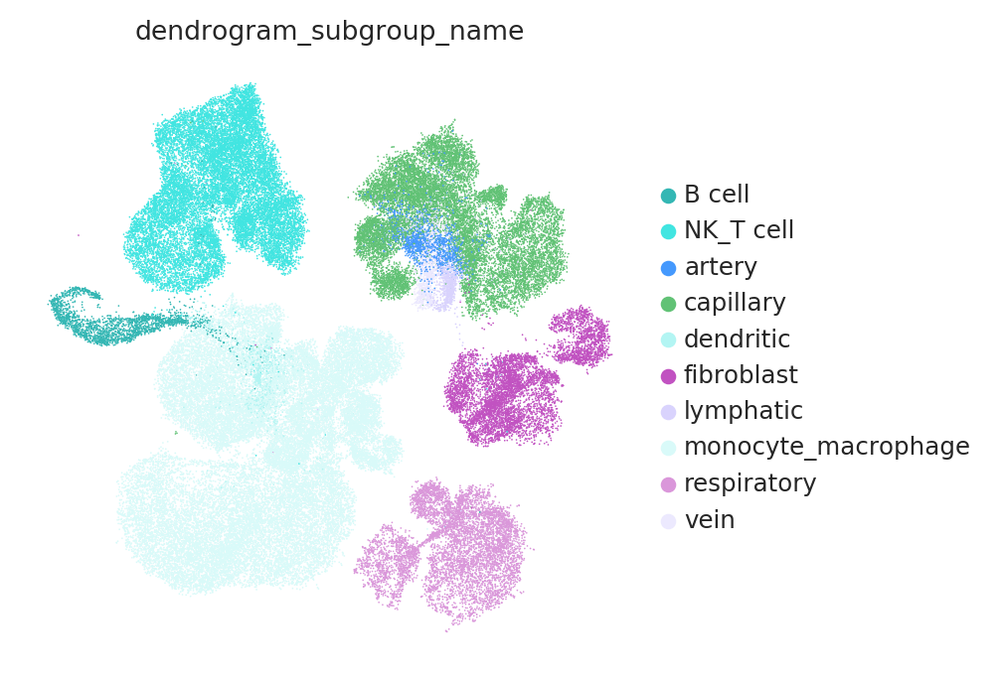

In [228]:
sc.pl.umap(adata, color='dendrogram_subgroup_name', save='__dendrogram_subgroup',)

In [229]:
narrow_to_dendrogram_color = pd.Series(
    lemur_obs_colors[["narrow_group", "dendrogram_subgroup_color_hex"]]
    .set_index("narrow_group")["dendrogram_subgroup_color_hex"]
    .to_dict()
)
narrow_to_dendrogram_color

monocyte                                    #d9d3fd
capillary cell                              #b3f5f3
alveolar macrophage                         #d9d3fd
proliferating alveolar macrophage           #d9d3fd
CD4+ T cell                                 #da97da
natural killer cell                         #da97da
plasma cell                                 #c152c1
vein cell                                   #41e5e1
alveolar fibroblast                         #61c275
alveolar epithelial cell type 2             #4599fd
adventitial fibroblast                      #61c275
capillary aerocyte cell                     #b3f5f3
B cell                                      #c152c1
CD8+ T cell                                 #da97da
lymphatic cell                              #d9faf9
conventional dendritic cell                 #ece9fe
ciliated cell                               #4599fd
pericyte cell                               #61c275
proliferating natural killer cell_T cell    #da97da
natural kill

In [230]:
narrow_to_dendrogram_color = narrow_to_dendrogram_color.sort_index()
narrow_to_dendrogram_color

B cell                                      #c152c1
CD4+ T cell                                 #da97da
CD8+ T cell                                 #da97da
adventitial fibroblast                      #61c275
alveolar epithelial cell type 2             #4599fd
alveolar fibroblast                         #61c275
alveolar macrophage                         #d9d3fd
artery cell                                 #34b7b4
capillary aerocyte cell                     #b3f5f3
capillary cell                              #b3f5f3
ciliated cell                               #4599fd
conventional dendritic cell                 #ece9fe
lymphatic cell                              #d9faf9
monocyte                                    #d9d3fd
natural killer T cell                       #da97da
natural killer cell                         #da97da
pericyte cell                               #61c275
plasma cell                                 #c152c1
plasmacytoid dendritic cell                 #ece9fe
proliferatin

In [231]:
adata.uns.keys()

dict_keys(['hvg', 'pca', 'neighbors', 'umap', 'species_colors', 'species_batch_colors', 'dendrogram_group_name_colors', 'dendrogram_subgroup_name_colors'])

In [232]:
adata.obs['dendrogram_group'] = adata.obs['narrow_group'].copy()
adata.uns['dendrogram_group_colors'] = narrow_to_dendrogram_color.values.tolist()

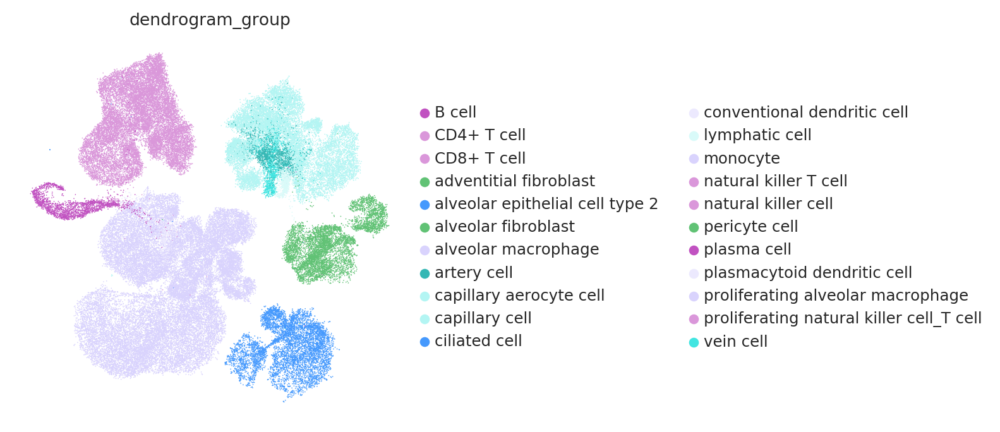

In [233]:
sc.pl.umap(adata, color='dendrogram_group', save='__narrow_group_dendrogram',)

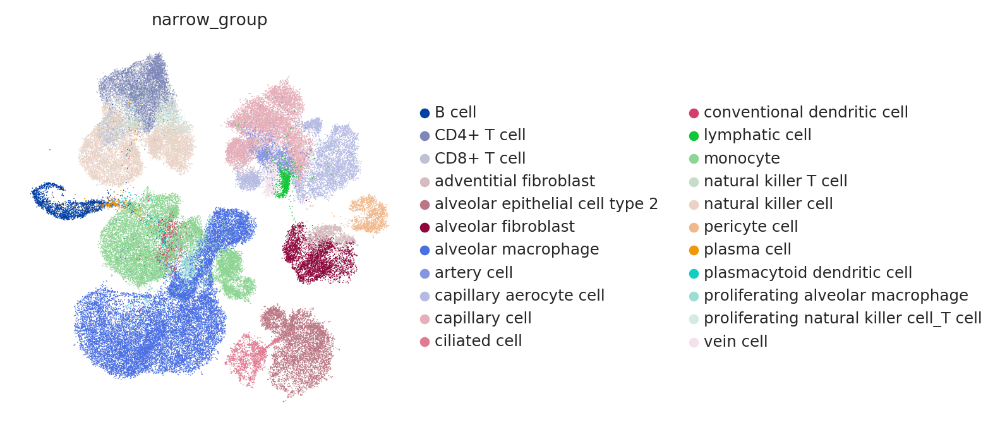

In [234]:
sc.pl.umap(adata, color='narrow_group', save='__narrow_group')

### Compartment group

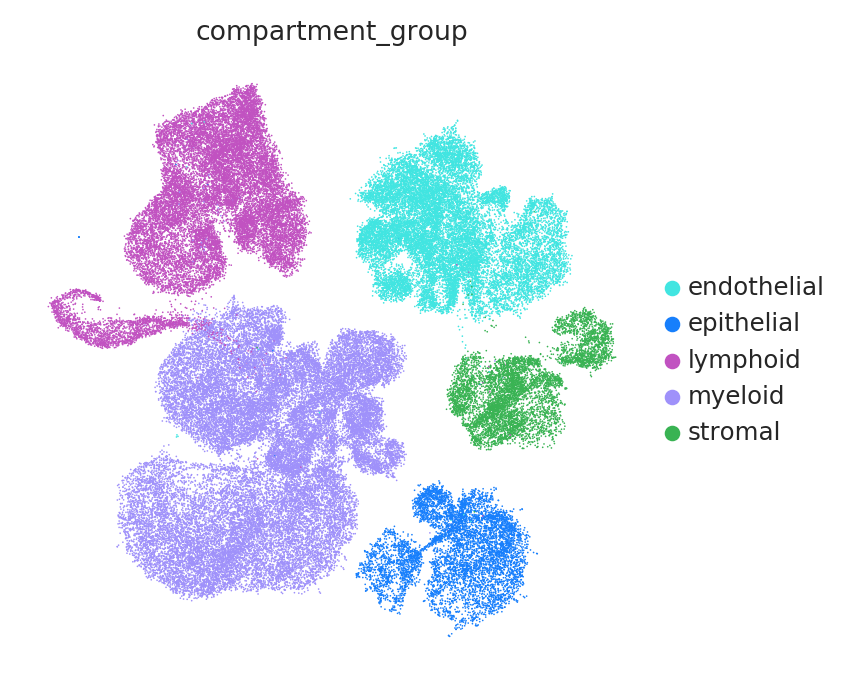

In [235]:
# there is some bug when the palette is pre-set
try:
    del adata.uns['compartment_group_colors']
except KeyError:
    pass

sc.pl.umap(adata, color='compartment_group', save='__compartment_group', palette=plot_constants.compartment_to_color)

## Write output adata to file

In [236]:
# # Write BBKNN + UMAP data to file
adata.write(output_file)

In [266]:
output_file

'/home/olga/data_lg/data_sm_copy/tabula-microcebus/data-objects/cross-species/concatenated__human-lemur-mouse_10x__one2one_orthologs__lung__preprocessed.h5ad'

In [237]:
adata.obs.groupby(['narrow_group', 'species']).size()

narrow_group                              species    
B cell                                    Mouse           1457
                                          Mouse lemur      238
                                          Human            230
CD4+ T cell                               Mouse            534
                                          Mouse lemur     1258
                                          Human           2297
CD8+ T cell                               Mouse            854
                                          Mouse lemur      388
                                          Human           1942
adventitial fibroblast                    Mouse            517
                                          Mouse lemur      317
                                          Human            527
alveolar epithelial cell type 2           Mouse            122
                                          Mouse lemur      948
                                          Human           4185
a

## Write narrow group names for correlations

In [238]:
' '.join([x.replace(' ',  '\\') for x in sorted(set(adata.obs['narrow_group']))])

'B\\cell CD4+\\T\\cell CD8+\\T\\cell adventitial\\fibroblast alveolar\\epithelial\\cell\\type\\2 alveolar\\fibroblast alveolar\\macrophage artery\\cell capillary\\aerocyte\\cell capillary\\cell ciliated\\cell conventional\\dendritic\\cell lymphatic\\cell monocyte natural\\killer\\T\\cell natural\\killer\\cell pericyte\\cell plasma\\cell plasmacytoid\\dendritic\\cell proliferating\\alveolar\\macrophage proliferating\\natural\\killer\\cell_T\\cell vein\\cell'

# Plot correlations

## Append path to import

In [239]:
# sys.path.append('/home/olga/code/xspecies--olgabot/refactor-bladder-blood-lung-muscle/')

import visualize_correlation as corr_viz

In [240]:
sorted(adata.obs.narrow_group.unique())

['B cell',
 'CD4+ T cell',
 'CD8+ T cell',
 'adventitial fibroblast',
 'alveolar epithelial cell type 2',
 'alveolar fibroblast',
 'alveolar macrophage',
 'artery cell',
 'capillary aerocyte cell',
 'capillary cell',
 'ciliated cell',
 'conventional dendritic cell',
 'lymphatic cell',
 'monocyte',
 'natural killer T cell',
 'natural killer cell',
 'pericyte cell',
 'plasma cell',
 'plasmacytoid dendritic cell',
 'proliferating alveolar macrophage',
 'proliferating natural killer cell_T cell',
 'vein cell']

In [241]:
{k: list(v) for k, v in adata.obs.groupby('compartment_group').narrow_group.unique().to_dict().items()}

{'endothelial': ['capillary cell',
  'capillary aerocyte cell',
  'vein cell',
  'artery cell',
  'lymphatic cell'],
 'epithelial': ['alveolar epithelial cell type 2', 'ciliated cell'],
 'lymphoid': ['B cell',
  'natural killer cell',
  'CD8+ T cell',
  'natural killer T cell',
  'CD4+ T cell',
  'plasma cell',
  'proliferating natural killer cell_T cell'],
 'myeloid': ['monocyte',
  'alveolar macrophage',
  'conventional dendritic cell',
  'proliferating alveolar macrophage',
  'plasmacytoid dendritic cell'],
 'stromal': ['adventitial fibroblast', 'alveolar fibroblast', 'pericyte cell']}

## Write yaml config

In [242]:
%%file config_lung.yml

all_groups:
   {"compartment": ['endothelial', 'epithelial', 'lymphoid', 'myeloid', 'stromal'],
    "broad": ['B cell',
 'T cell',
 'alveolar epithelial cell type 2',
 'artery cell',
 'capillary cell',
 'ciliated cell',
 'dendritic cell',
 'endothelial cell',
 'fibroblast',
 'lymphatic cell',
 'macrophage',
 'monocyte',
#  'myofibroblast cell',
 'natural killer T cell',
 'natural killer cell',
 'pericyte cell',
 'pericyte cell_smooth muscle cell',
 'plasma cell',
 'proliferating natural killer cell_T cell',
 'vein cell']
,
    "narrow": ['B cell',
 'CD4+ T cell',
 'CD8+ T cell',
 'adventitial fibroblast',
 'alveolar epithelial cell type 2',
 'alveolar fibroblast',
 'alveolar macrophage',
 'artery cell',
 'capillary aerocyte cell',
 'capillary cell',
 'ciliated cell',
 'conventional dendritic cell',
 'lymphatic cell',
 'monocyte',
#  'myofibroblast cell',
 'natural killer T cell',
 'natural killer cell',
 'pericyte cell',
 'plasma cell',
 'plasmacytoid dendritic cell',
 'proliferating alveolar macrophage',
 'proliferating natural killer cell_T cell',
 'vein cell']
}
compartment_narrow: {'endothelial': ['capillary cell',
  'capillary aerocyte cell',
  'vein cell',
  'artery cell',
  'lymphatic cell'],
 'epithelial': ['alveolar epithelial cell type 2', 'ciliated cell'],
 'lymphoid': ['B cell',
  'natural killer cell',
  'CD8+ T cell',
  'natural killer T cell',
  'CD4+ T cell',
  'plasma cell',
  'proliferating natural killer cell_T cell'],
 'myeloid': ['monocyte',
  'alveolar macrophage',
  'conventional dendritic cell',
  'proliferating alveolar macrophage',
  'plasmacytoid dendritic cell'],
 'stromal': [
#      'myofibroblast cell',
  'adventitial fibroblast',
  'alveolar fibroblast',
  'pericyte cell']}
significant_compartment_narrow: {
    'endothelial': ['Capillary', 'Capillary Aerocyte', 'Lymphatic'],
    'epithelial': ['Alveolar Epithelial Type 2'],
    'lymphoid': ['CD4+ T', 'Natural Killer', 'Plasma', 'Proliferating NK/T'],
    'myeloid': [
        'Macrophage', 'Monocyte', 'Myeloid Dendritic', 'Proliferating Macrophage'],
    'stromal': ['Adventitial Fibroblast', 'Alveolar Fibroblast']}


Overwriting config_lung.yml


## Read YAML config

In [243]:
config_yaml_path = 'config_lung.yml'


with open(config_yaml_path) as file:
    config = yaml.full_load(file)
    
groups = config["all_groups"].keys()

## Read dataframes

In [244]:
config['compartment_narrow']

{'endothelial': ['capillary cell',
  'capillary aerocyte cell',
  'vein cell',
  'artery cell',
  'lymphatic cell'],
 'epithelial': ['alveolar epithelial cell type 2', 'ciliated cell'],
 'lymphoid': ['B cell',
  'natural killer cell',
  'CD8+ T cell',
  'natural killer T cell',
  'CD4+ T cell',
  'plasma cell',
  'proliferating natural killer cell_T cell'],
 'myeloid': ['monocyte',
  'alveolar macrophage',
  'conventional dendritic cell',
  'proliferating alveolar macrophage',
  'plasmacytoid dendritic cell'],
 'stromal': ['adventitial fibroblast', 'alveolar fibroblast', 'pericyte cell']}

In [245]:
groups

dict_keys(['compartment', 'broad', 'narrow'])

In [256]:
correl_dir = '/home/olga/data_lg/data_sm_copy/tabula-microcebus/analyses/xi-correlation'
within_celltypes_filenames = glob.glob(os.path.join(correl_dir, 'lung__xi__narrow_group__drop_if_either_zero*.parquet'))

dfs_within = defaultdict(list)
for filename in within_celltypes_filenames:
    for group in groups:
        if group in filename:
            df = pd.read_parquet(filename)
            df = df.rename(
                columns={group + "_group": "cell_ontology_class"})
            dfs_within[group].append(df)
len(dfs_within)

1

In [257]:
dfs_within.keys()

dict_keys(['narrow'])

In [258]:
narrow_correl = pd.concat(dfs_within['narrow'])
print(narrow_correl.shape)
narrow_correl.head()

(198000, 7)


,cell_ontology_class,species1,species2,iteration,xi,cell1,cell2
0,capillary cell,Mouse,Mouse,0,0.183969,AACCATGGTCTACCTC-1-53-0-0-mouse_tabula_muris_s...,AGTCTTTTCGCCTGAG-1-14-1-0-mouse_tabula_muris_s...
1,capillary cell,Mouse,Mouse lemur,0,0.213323,AACCATGGTCTACCTC-1-53-0-0-mouse_tabula_muris_s...,Antoine_Lung_P3_10X_TCTCTAAGTGATGTCT-lemur
2,capillary cell,Mouse,Human,0,0.122617,AACCATGGTCTACCTC-1-53-0-0-mouse_tabula_muris_s...,P2_3_TGAGAGGTCAGAGACG-human_hlca
3,capillary cell,Mouse lemur,Mouse,0,0.172901,Antoine_Lung_P3_10X_GACCTGGTCCCTCTTT-lemur,AGTCTTTTCGCCTGAG-1-14-1-0-mouse_tabula_muris_s...
4,capillary cell,Mouse lemur,Mouse lemur,0,0.170379,Antoine_Lung_P3_10X_GACCTGGTCCCTCTTT-lemur,Antoine_Lung_P3_10X_TCTCTAAGTGATGTCT-lemur


In [259]:
narrow_correl.shape

(198000, 7)

In [260]:
import seaborn as sns

In [261]:
mean_correl = narrow_correl.groupby(['cell_ontology_class', 'species1', 'species2']).xi.mean()
mean_correl = mean_correl.reset_index()
mean_correl['species12'] = mean_correl.apply(lambda x: '--'.join(sorted([x.species1, x.species2])), axis=1)
mean_correl['species12'].unique()

array(['Human--Human', 'Human--Mouse', 'Human--Mouse lemur',
       'Mouse--Mouse', 'Mouse--Mouse lemur', 'Mouse lemur--Mouse lemur'],
      dtype=object)

In [262]:
mean_correl.pivot_table(index='cell_ontology_class', columns='species12', values='xi')

species12,Human--Human,Human--Mouse,Human--Mouse lemur,Mouse lemur--Mouse lemur,Mouse--Mouse,Mouse--Mouse lemur
cell_ontology_class,,,,,,
B cell,0.555318,0.477808,0.464008,0.523957,0.487557,0.464296
CD4+ T cell,0.435217,0.408492,0.383168,0.461737,0.472127,0.429659
CD8+ T cell,0.457619,0.427784,0.364000,0.403815,0.472411,0.388263
adventitial fibroblast,0.280510,0.238983,0.222502,0.257022,0.297802,0.227984
alveolar epithelial cell type 2,0.360831,0.297596,0.305959,0.348253,0.341208,0.292879
alveolar fibroblast,0.234971,0.186550,0.168921,0.210634,0.261225,0.169935
alveolar macrophage,0.350915,0.260623,0.284231,0.344647,0.331582,0.271589
artery cell,0.270842,0.233720,0.190449,0.209926,0.291502,0.190111
capillary aerocyte cell,0.215124,0.155039,0.162815,0.228656,0.252386,0.153441


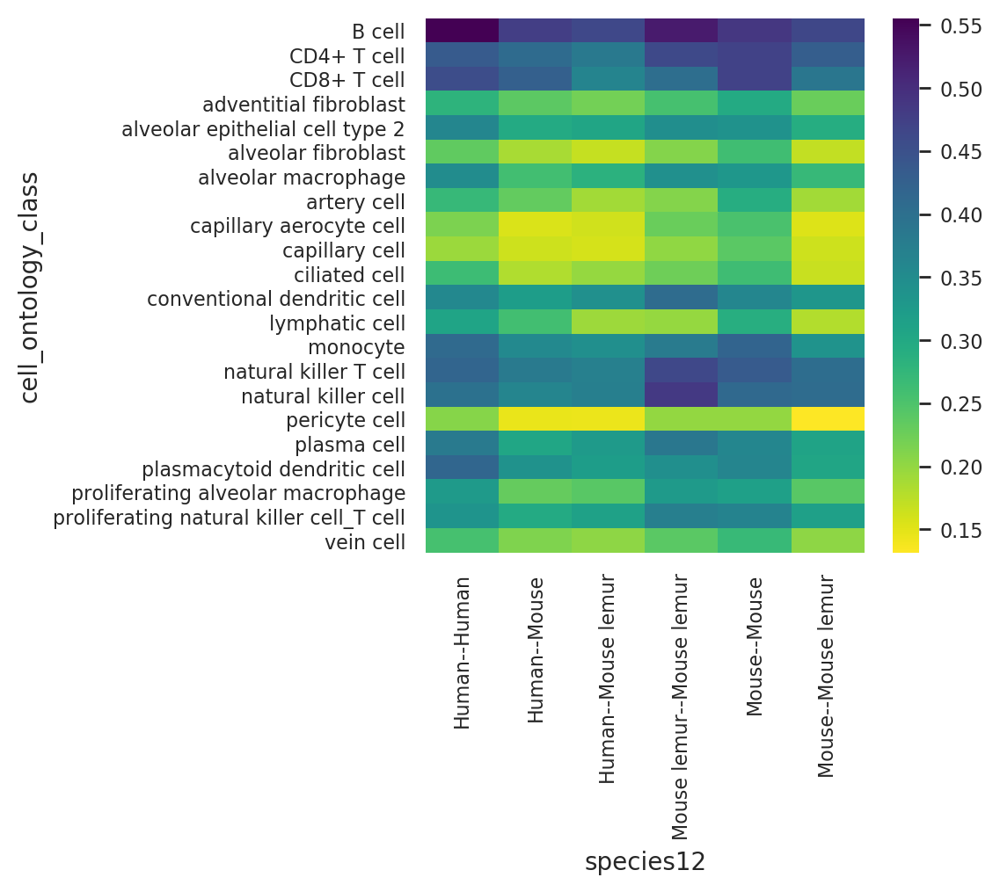

In [263]:
sns.heatmap(mean_correl.pivot_table(index='cell_ontology_class', columns='species12', values='xi'), cmap='viridis_r')

## Visualize correlation

### Sset output folder

In [264]:
output_folder = '/home/olga/googledrive/TabulaMicrocebus/analysis/cross-species--bladder-blood-lung-muscle/lung/correlation'
! mkdir -p $output_folder

species2                                   Mouse  Mouse lemur
species1 cell_ontology_class iteration                       
Human    B cell              0          0.424644     0.446326
                             1          0.446670     0.499924
                             2          0.524596     0.500147
                             3          0.533812     0.489634
                             4          0.531937     0.471441


/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing 

species2                                      Human     Mouse
species1    cell_ontology_class iteration                    
Mouse lemur B cell              0          0.461489  0.458151
                                1          0.477748  0.408288
                                2          0.329190  0.466946
                                3          0.543679  0.473464
                                4          0.488241  0.528275


/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/home/olga/miniconda3/envs/tabula-microcebus-jan2021/lib/python3.7/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing 

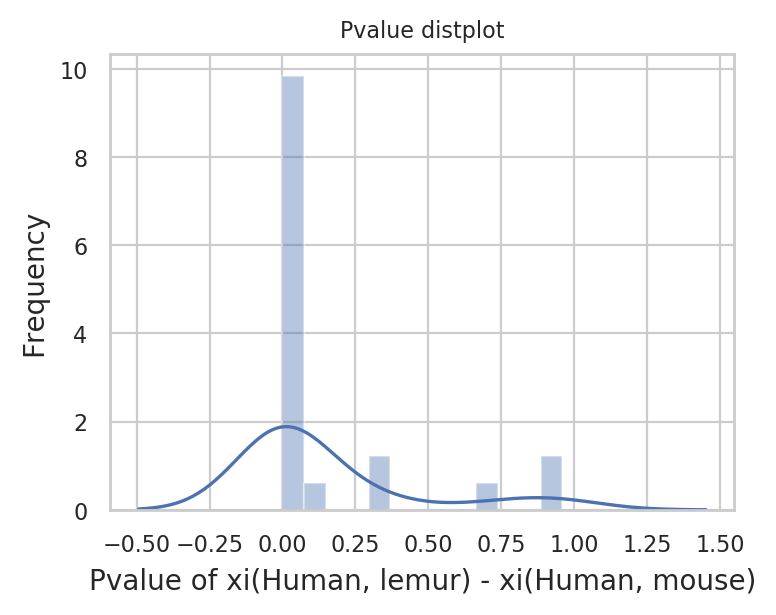

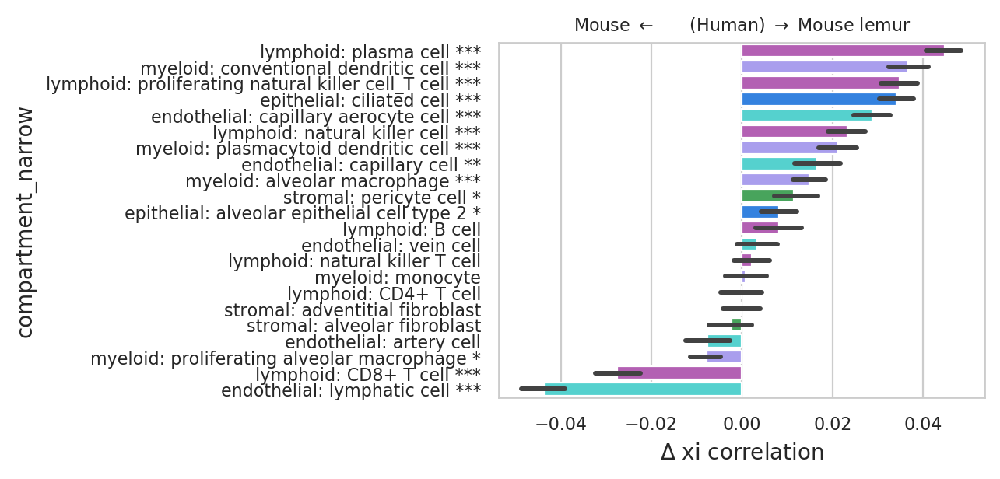

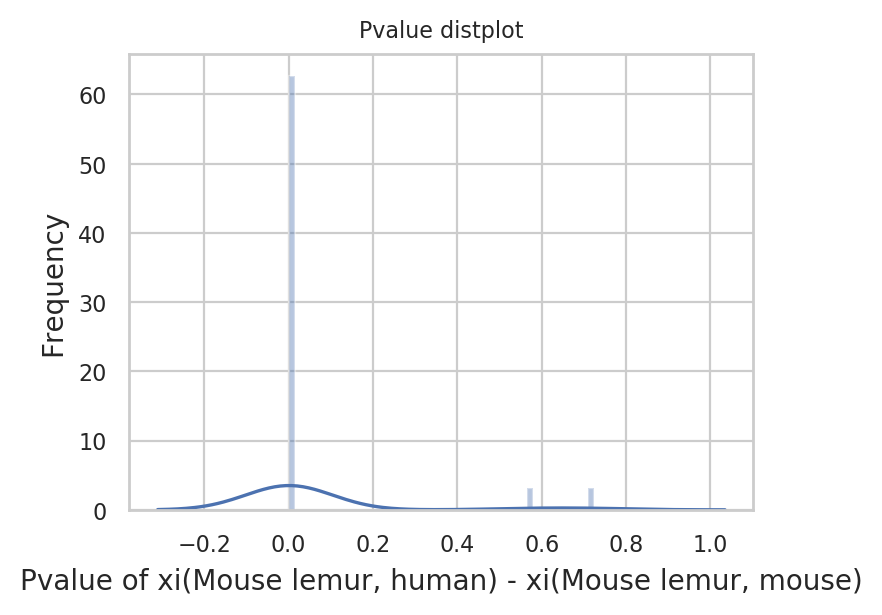

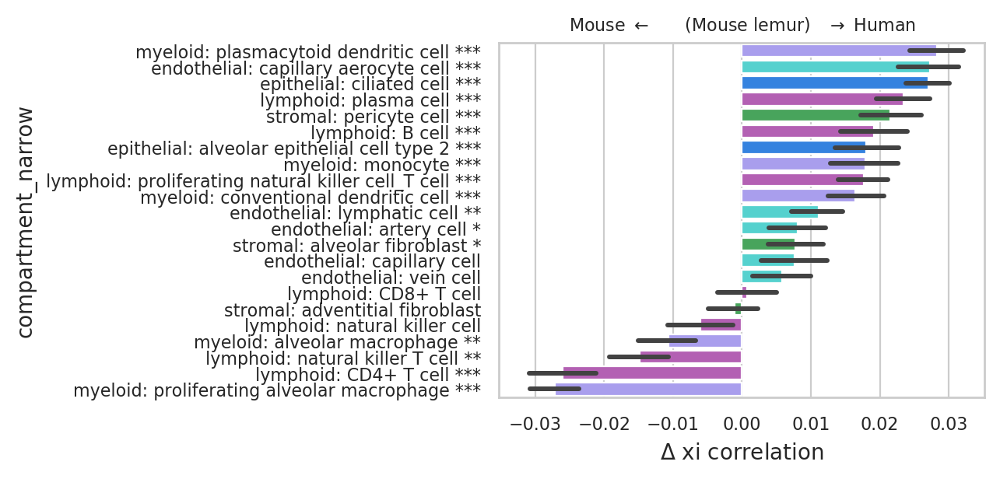

In [265]:
from matplotlib import rc
rc('font',**{'family':'sans-serif','sans-serif':['Arial']})
# rc('font',**{'family':'serif','serif':['Times']})
rc('text', usetex=False)

pvalue_level_kws=dict(level3=1e-10, level2=1e-5, level1=1e-2)

for key, dictionary in config.items():
    if "all_groups" == key:
        continue
    if "significant" in key:
        continue
#         df = pd.concat(dfs_within["narrow"], ignore_index=True)
#         narrow_celltypes_significant = []
#         for key, value in config["significant_compartment_narrow"].items():
#             narrow_celltypes_significant.extend(value)
#         df = df[df['cell_ontology_class'].isin(
#             narrow_celltypes_significant)]
    else:
        df = pd.concat(dfs_within["narrow"], ignore_index=True)
    corr_viz.corr_diff_within(df, "Human", dictionary, pvalue_level_kws=pvalue_level_kws)
    corr_viz.corr_diff_within(df, "Mouse lemur", dictionary, pvalue_level_kws=pvalue_level_kws)

    
    
for i in plt.get_fignums():
    fig = plt.figure(i)
    fig.set_size_inches(4, 3)
#     fig.tight_layout()
    fig.savefig(os.path.join(output_folder, "figure%d.png" % i))
    fig.savefig(os.path.join(output_folder, "figure%d.pdf" % i))